- 미션 소개
    이번 미션에서는 흉부 X-Ray 사진을 바탕으로 폐렴 환자를 구분하는 작업을 수행합니다. 이번 미션의 목표는 X-Ray 사진을 입력으로 받아 폐렴 여부를 구분하는 분류(Classification) 모델을 만드는 것입니다. 아래 데이터셋을 활용하여 다양한 이미지 전처리 및 증강 기법과 Transfer Learning과 Fine-Tuning 기법을 실험해보고, 모델의 성능을 평가해 보세요.

- 데이터 소개
    - 데이터 링크(Chest X-Ray Images (Pneumonia)) : https://www.kaggle.com/datasets/paultimothymooney/chest-xray-pneumonia/data
        - train: 훈련 데이터
        - test: 테스트 데이터
        - val: 검증 데이터
- 제출 안내
    
    다음 내용을 포함한 Colab Notebook 파일을 제출해 주세요. 파일 이름은 각각 06_{팀명}_{성함}.ipynb로 해주세요.

    1. 분석 과정과 결과:
        - 데이터 로드, 전처리, 모델 학습, 예측, 성능 평가 등의 모든 과정을 포함해야 합니다.
        - 사전 학습된 모델을 활용한 Transfer Learning을 적용해 보세요.
        - Fine-Tuning을 적용해 보세요. Frozen 모델, Partial Fine-Tuning, Full Fine-Tuning을 비교하며 실험을 진행해 봅시다.
        - 모델별 성능 비교, 분석 결과를 코드와 함께 정리해 주세요.
    2. 마크다운을 활용한 설명
        - 코드의 각 단계에서 어떤 작업을 수행하는지, 어떤 의도를 가지고 접근했는지 명확히 표현할 수 있도록 마크다운을 적극 활용해 주세요.
        - 코드와 실행 결과를 설명하는 문구를 추가하여, 전체 코드의 흐름을 이해할 수 있도록 작성해 주세요. 보고서를 따로 작성하지 않으므로, 노트북 파일 내에 모든 설명이 잘 드러나야 합니다.
    3. 모델 성능 평가 및 제출
        - 평가 지표(Accuracy, Precision, Recall, F1-score 등)를 활용해 모델 성능을 분석하고 비교해 보세요.
        - 제공된 데이터셋의 테스트 파일을 사용하여 모델을 테스트해 보세요.
        - 모델별 성능 평가 결과를 포함한 노트북 파일을 제출하세요.
- 참고 사항
    - 미션을 시작할 때 도움이 필요하다면, Baseline 코드를 참고할 수 있습니다. 이 코드는 기본적인 코드로 제공되며, 여러분이 원하는 대로 자유롭게 변형할 수 있어요.
        - Baseline 코드 링크
        - 주의 사항: Baseline 코드는 여러분이 모델을 시작하는 데 도움을 주기 위한 참고 자료일 뿐이며, Baseline 코드를 그대로 사용하는 것보다는 이를 기반으로 자신의 아이디어를 추가하고 발전시키는 것이 중요합니다. 가능하면 스스로 모델을 구축해보고 다양한 방법을 시도하여 성능을 향상시켜 보세요.

# 0.연구 방법 및 결론

0. 캐글
 - https://www.kaggle.com/code/youngsunjoung/transfer-learning-of-chest-xray-pytorch

1. 데이터 전처리
    1. train : validation : test = 4185 : 1047 : 624의 비율로 나누었음
    2. transform
        - 평균 = [0.485, 0.456, 0.406], 분산 : [0.229, 0.224, 0.225]
        - 리사이즈 (224, 224), 정규화
        - 학습데이터에는 수평 뒤집기, 5도 회전, 밝기 조절 추가
2. 모델 및 타입
    1. DenseNet-121, ResNet-50, GoogLeNet(Inception-V1)의 3가지 모델
    2. Frozen, Partial, Full Fine-tuning의 3가지 타입
        - Frozen : 마지막 분류기만 학습함
        - Partial : 마지막 분류기 + 직전의 Conv Block을 추가 학습함
        - Full : 전체 학습
3. 학습 및 검증, 시험
    1. 학습 : 얼리 스탑핑을 사용하여 Best Validation Loss가 나올 때 마다 구글 드라이브에 저장
    2. 시험 : Best Validation Loss 모델을 이용하여 점수(Test Loss, Accuracy, Precision, Recall, F1-score)를 측정함
4. 하이퍼파라미터
    1. 공통
        - criterion = nn.CrossEntropyLoss()
    2. Frozen
        - optimizer = AdamW(densenet_frozen.classifier.parameters(), lr=1e-5, weight_decay=1e-4)
        - scheduler = StepLR(optimizer, step_size=5, gamma=0.1)
        - num_epochs = 15
        - patience = 5
    3. Partial
        - optimizer = AdamW(trainable_params, lr=1e-3, weight_decay=1e-4)
        - scheduler = CosineAnnealingLR(optimizer, T_max=10, eta_min=1e-6)
        - num_epochs = 20
        - patience = 7
    4. Full
        - optimizer = AdamW(densenet_full.parameters(), lr=1e-3, weight_decay=1e-4)
        - scheduler = ReduceLROnPlateau(optimizer, patience=5, factor=0.5, min_lr=1e-6)
        - num_epochs = 30
        - patience = 10
5. 시각화
    1. Grad-CAM 시각화(정상-정상, 정상-폐렴, 폐렴-폐렴, 폐렴-정상)
    2. 학습 및 검증 손실과 정확도
    3. 시험 후 혼동행렬

6. 모델링 결과
    1. Frozen (Kaggle All Frozen version)
        - DenseNet : Test Loss(0.3791), Accuracy(0.8606), Precision(0.8230), Recall(0.9897), F1 Score(0.8987)
        - ResNet : Test Loss(0.4549), Accuracy(0.8317), Precision(0.7963), Recall(0.9821), F1 Score(0.8794)
        - GoogLeNet : Test Loss(0.4043), Accuracy(0.8349), Precision(0.8008), Recall(0.9795), F1 Score(0.8812)
        - 시각화 (Kaggle All Frozen version with Epochs=15)
    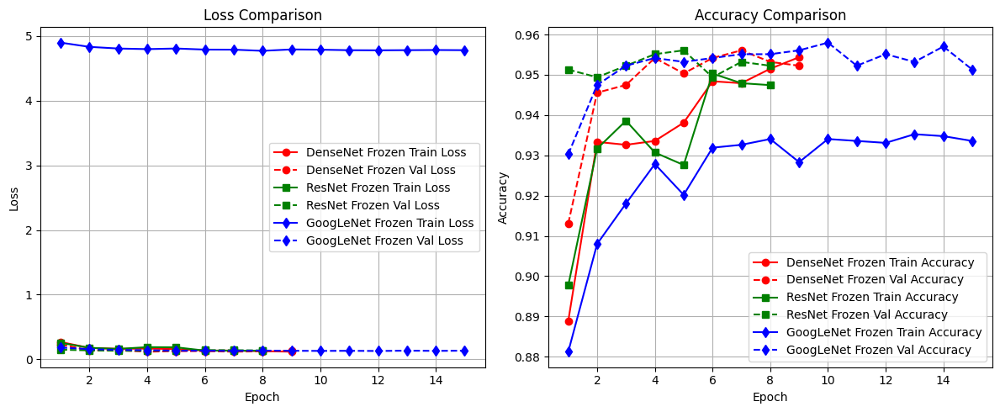
    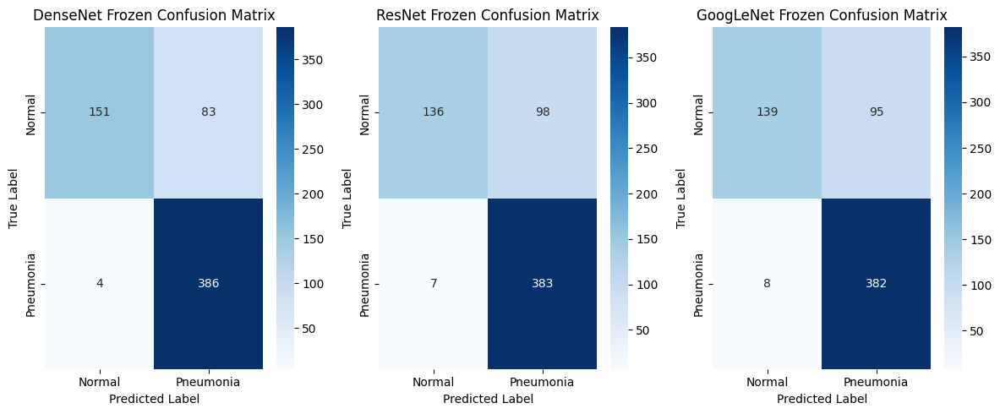

6. 모델링 결과
    2. Partial (Kaggle DenseNet Partial, ResNet Partial, GoogLeNet Partial version)
        - DenseNet : Test Loss(1.0580), Accuracy(0.8317), Precision(0.7890), Recall(0.9974), F1 Score(0.8811)
        - ResNet : Test Loss(1.0608), Accuracy(0.8077), Precision(0.7657), Recall(0.9974), F1 Score(0.8664)
        - GoogLeNet : Test Loss(1.1840), Accuracy(0.8109), Precision(0.7698), Recall(0.9949), F1 Score(0.8680)
        - 시각화 (Kaggle All Partial version with Epochs=14)
        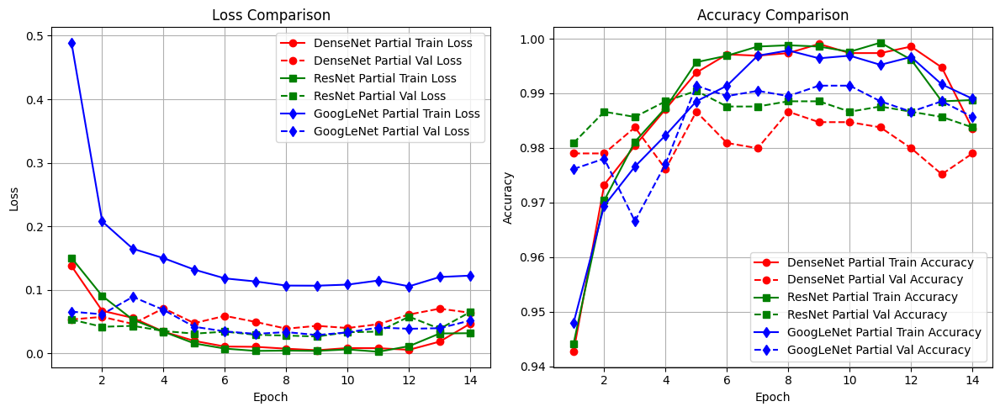
        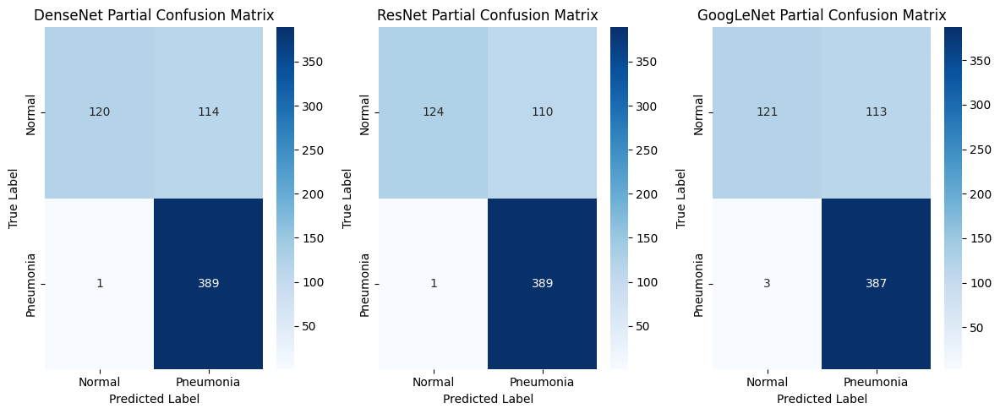

6. 모델링 결과
    3. Full (Kaggle DenseNet Full, ResNet Full, GoogLeNet Full version)
        - DenseNet : Test Loss(0.7792), Accuracy(0.8269), Precision(0.7843), Recall(0.9974), F1 Score(0.8781)
        - ResNet : Test Loss(1.0904), Accuracy(0.8269), Precision(0.7854), Recall(0.9949), F1 Score(0.8778)
        - GoogLeNet : Test Loss(1.5648), Accuracy(0.8013), Precision(0.7598), Recall(0.9974), F1 Score(0.8625)
        - 시각화 (Kaggle All Full version with Epochs=9)
        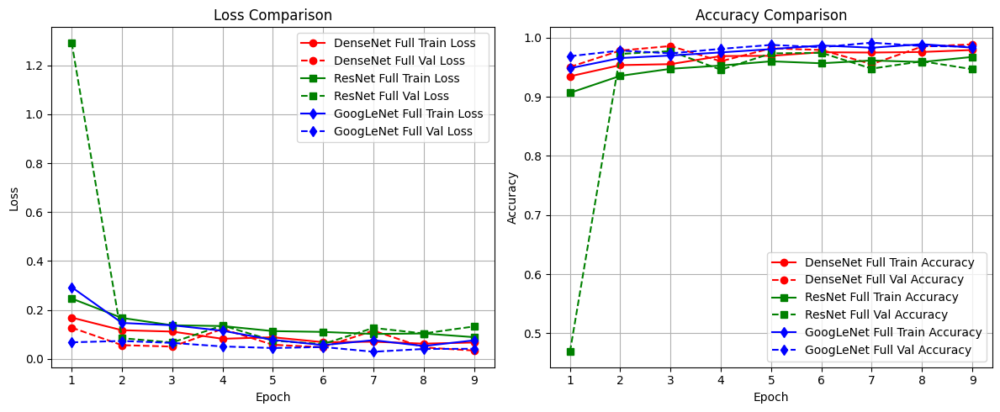
        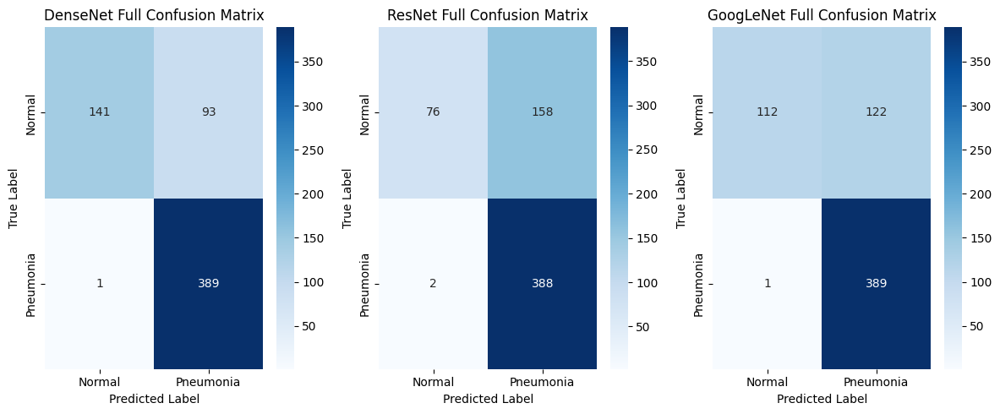

7. 결론
    - 모든 모델들의 recall score가 높았다.(폐렴이든 정상이든 폐렴으로 분류하는 경향이 높았다.)
    - Grad-CAM의 feature map은 이미지의 거의 모든 면을 중요하게 보았다.(학습이 충분하지 않아서인지 아니면 feature를 잘 못 뽑은 것인지는 모르겠다.)
    - 그래도 Transfer Learning인지라 이정도 시간과 노력으로 높은 수치를 얻은 것은 확실한 것 같다. 여기서 더 발전할 점이 많은 것도 좋았다.

# 1.사전준비

In [ ]:
# 시스템 및 기본 패키지
import os
import math
import numpy as np
import pandas as pd
import cv2
from PIL import Image

# PyTorch 관련 라이브러리
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader, random_split

# torchvision 관련 라이브러리 (데이터 로딩 및 모델)
import torchvision
from torchvision import datasets, transforms, models
import torchvision.transforms.functional as TF

# 데이터 시각화
import matplotlib.pyplot as plt
import seaborn as sns

# 모델 학습 진행률 표시
from tqdm import tqdm

# 성능 평가 지표 (Accuracy, Precision, Recall, F1-score)
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix

In [ ]:
# Kaggle 라이브러리 설치
!pip install kaggle

# Kaggle 데이터셋 다운로드
!kaggle datasets download -d paultimothymooney/chest-xray-pneumonia -p /content/

# 압축 해제
!unzip /content/chest-xray-pneumonia.zip -d /content/

스트리밍 출력 내용이 길어서 마지막 5000줄이 삭제되었습니다.
  inflating: /content/chest_xray/train/NORMAL/IM-0435-0001-0001.jpeg  
  inflating: /content/chest_xray/train/NORMAL/IM-0435-0001.jpeg  
  inflating: /content/chest_xray/train/NORMAL/IM-0437-0001-0001.jpeg  
  inflating: /content/chest_xray/train/NORMAL/IM-0437-0001-0002.jpeg  
  inflating: /content/chest_xray/train/NORMAL/IM-0437-0001.jpeg  
  inflating: /content/chest_xray/train/NORMAL/IM-0438-0001.jpeg  
  inflating: /content/chest_xray/train/NORMAL/IM-0439-0001-0001.jpeg  
  inflating: /content/chest_xray/train/NORMAL/IM-0439-0001-0002.jpeg  
  inflating: /content/chest_xray/train/NORMAL/IM-0439-0001.jpeg  
  inflating: /content/chest_xray/train/NORMAL/IM-0440-0001.jpeg  
  inflating: /content/chest_xray/train/NORMAL/IM-0441-0001.jpeg  
  inflating: /content/chest_xray/train/NORMAL/IM-0442-0001.jpeg  
  inflating: /content/chest_xray/train/NORMAL/IM-0444-0001.jpeg  
  inflating: /content/chest_xray/train/NORMAL/IM-0445-0001.jpeg  
  inflating: /c

# 2.데이터셋 살펴보기

In [ ]:
train_dir = "/content/chest_xray/train"
val_dir = "/content/chest_xray/val"
test_dir = "/content/chest_xray/test"

In [ ]:
def creat_dataframe(data_dir):
    img_paths = []
    labels = []

    for label in ["NORMAL", "PNEUMONIA"]:
        class_dir = os.path.join(data_dir, label)
        for img_file in os.listdir(class_dir):
            img_paths.append(os.path.join(class_dir, img_file))
            labels.append(label)

    df = pd.DataFrame({"image_paths": img_paths, "label": labels})
    return df

In [ ]:
train_df = creat_dataframe(train_dir)
val_df = creat_dataframe(val_dir)
test_df = creat_dataframe(test_dir)

## 결측값(없음)

In [ ]:
train_df.isnull().sum()

,0
image_paths,0
label,0


In [ ]:
val_df.isnull().sum()

,0
image_paths,0
label,0


In [ ]:
test_df.isnull().sum()

,0
image_paths,0
label,0


## 중복값(없음)

In [ ]:
train_df.duplicated().sum()

0

In [ ]:
val_df.duplicated().sum()

0

In [ ]:
test_df.duplicated().sum()

0

## 데이터 분포 시각화

In [ ]:
def visualize_label_distribution(df):
    label_counts = df["label"].value_counts()
    print(label_counts)
    plt.figure(figsize=(14,5))

    # pie plot
    plt.subplot(1, 2, 1)
    plt.pie(label_counts, labels=label_counts.index, autopct="%1.2f%%")
    plt.title("Label Distribution")

    # bar plot
    plt.subplot(1, 2, 2)
    plt.bar(label_counts.index, label_counts.values)
    plt.xlabel("Label")
    plt.ylabel("Count")
    plt.title("Label Distribution")

label
PNEUMONIA    3875
NORMAL       1341
Name: count, dtype: int64


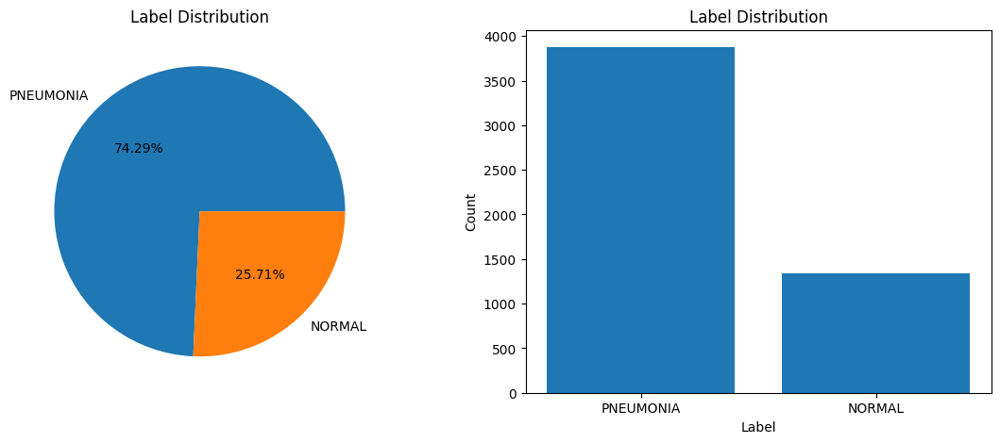

In [ ]:
visualize_label_distribution(train_df)

label
NORMAL       8
PNEUMONIA    8
Name: count, dtype: int64


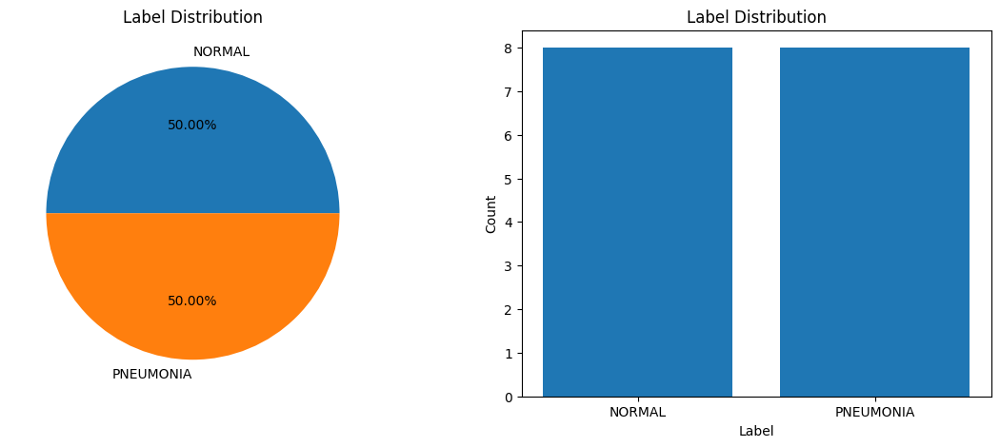

In [ ]:
visualize_label_distribution(val_df)

label
PNEUMONIA    390
NORMAL       234
Name: count, dtype: int64


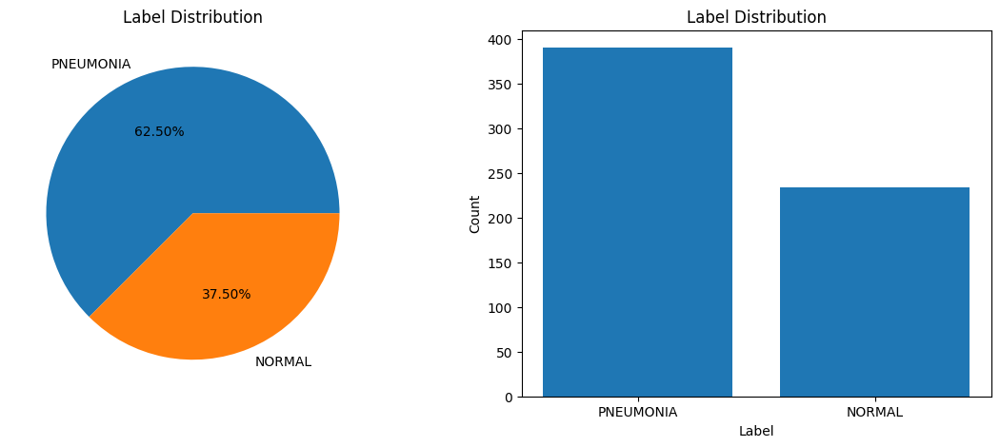

In [ ]:
visualize_label_distribution(test_df)

Validation 데이터가 16개밖에 되지 않아서 Train 데이터와 합친 후에 나누겠다.

# 3.데이터로더 만들기

In [ ]:
# 평균과 분산
mean = [0.485, 0.456, 0.406]
std = [0.229, 0.224, 0.225]

# 트랜스폼 설정
train_transform = transforms.Compose(
    [
        transforms.RandomHorizontalFlip(p=0.5),     # 수평 뒤집기
        transforms.RandomRotation(degrees=5),      # 5도 회전
        transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.1),  # 밝기 조절
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize(mean=mean, std=std),
    ]
)
val_transform = transforms.Compose(
    [
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize(mean=mean, std=std),
    ]
)
test_transform = transforms.Compose(
    [
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize(mean=mean, std=std),
    ]
)

In [ ]:
from torch.utils.data import ConcatDataset

# 학습 검증데이터 불러오기
train_dataset = datasets.ImageFolder(train_dir, transform=None)
val_dataset = datasets.ImageFolder(val_dir, transform=None)

# 학습 검증 합치기
combined_dataset = ConcatDataset([train_dataset, val_dataset])

# 8:2로 나누기
train_size = int(0.8 * len(combined_dataset))
val_size = len(combined_dataset) - train_size
train_dataset, val_dataset = random_split(combined_dataset, [train_size, val_size])

In [ ]:
class TransformDataset(Dataset):
    """기존 Dataset에 새로운 Transform을 적용하는 Wrapper"""
    def __init__(self, dataset, transform):
        self.dataset = dataset
        self.transform = transform

    def __getitem__(self, index):
        image, label = self.dataset[index]  # 기존 dataset에서 이미지와 라벨 가져오기
        if self.transform:
            image = self.transform(image)  # 새로운 Transform 적용
        return image, label

    def __len__(self):
        return len(self.dataset)

In [ ]:
# 학습, 검증, 시험 데이터셋
train_dataset = TransformDataset(train_dataset, train_transform)
val_dataset = TransformDataset(val_dataset, val_transform)
test_dataset = datasets.ImageFolder(test_dir, transform=test_transform)

In [ ]:
# 학습, 검증, 시험 데이터셋 확인
print(f"Train Dataset: {len(train_dataset)}")
print(f"Validation Dataset: {len(val_dataset)}")
print(f"Test Dataset: {len(test_dataset)}")

Train Dataset: 4185
Validation Dataset: 1047
Test Dataset: 624


In [ ]:
# 배치사이즈
batch_size = 16

# 데이터로더 설정
train_dataloader = DataLoader(train_dataset, batch_size=16, shuffle=True, num_workers=2, pin_memory=True)
val_dataloader = DataLoader(val_dataset, batch_size=16, shuffle=False, num_workers=2, pin_memory=True)
test_dataloader = DataLoader(test_dataset, batch_size=16, shuffle=False, num_workers=2, pin_memory=True)

In [ ]:
def check_dataloader(dataloader):
    print(f"Dataloader Length: {len(dataloader)}")
    for inputs, labels in dataloader:
        print(f"Inputs Shape: {inputs.shape}")
        print(f"Labels Shape: {labels.shape}")
        break

In [ ]:
print("Train")
check_dataloader(train_dataloader)
print("Validation")
check_dataloader(val_dataloader)
print("Test")
check_dataloader(test_dataloader)

Train
Dataloader Length: 262
Inputs Shape: torch.Size([16, 3, 224, 224])
Labels Shape: torch.Size([16])
Validation
Dataloader Length: 66
Inputs Shape: torch.Size([16, 3, 224, 224])
Labels Shape: torch.Size([16])
Test
Dataloader Length: 39
Inputs Shape: torch.Size([16, 3, 224, 224])
Labels Shape: torch.Size([16])


## 이미지 시각화

In [ ]:
def imshow(input_tensors, batch_size, cols=4):
    # 넘파이 배열 변경
    input_tensors = input_tensors.cpu().numpy().transpose((0, 2, 3, 1)) # (B, H, W, C)

    # 정규화 해제
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    input_tensors = (input_tensors * std) + mean
    input_tensors = np.clip(input_tensors, 0, 1)

    # 행, 열 개수 설정
    rows = batch_size // cols
    fig, axes = plt.subplots(rows, cols, figsize=(10, 10))  # 4x4 grid
    axes = axes.flatten()

    for i in range(batch_size):
        axes[i].imshow(input_tensors[i], cmap="gray")  # X-ray 흑백
        axes[i].axis("off")  # 축 제거

    plt.tight_layout()
    plt.show()

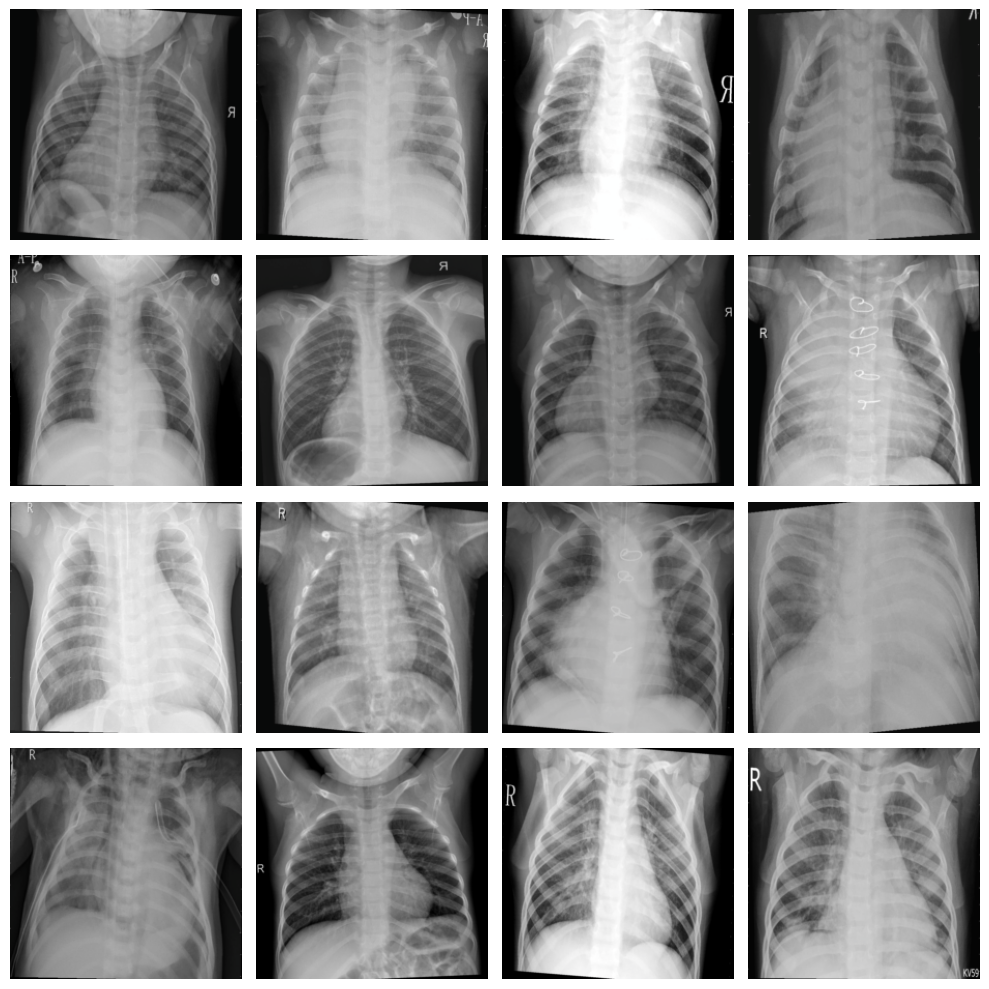

In [ ]:
train_inputs, _ = next(iter(train_dataloader))
imshow(train_inputs, batch_size, cols=4)

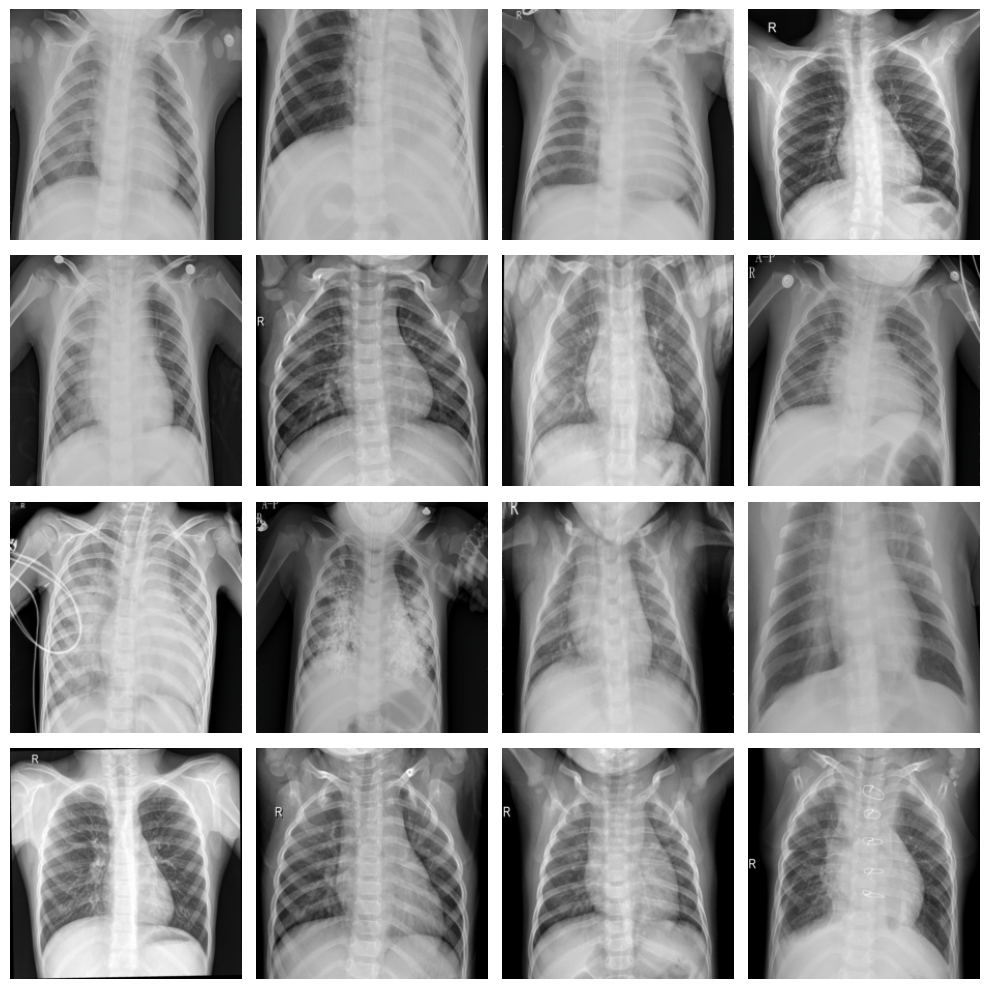

In [ ]:
val_inputs, _ = next(iter(val_dataloader))
imshow(val_inputs, batch_size, cols=4)

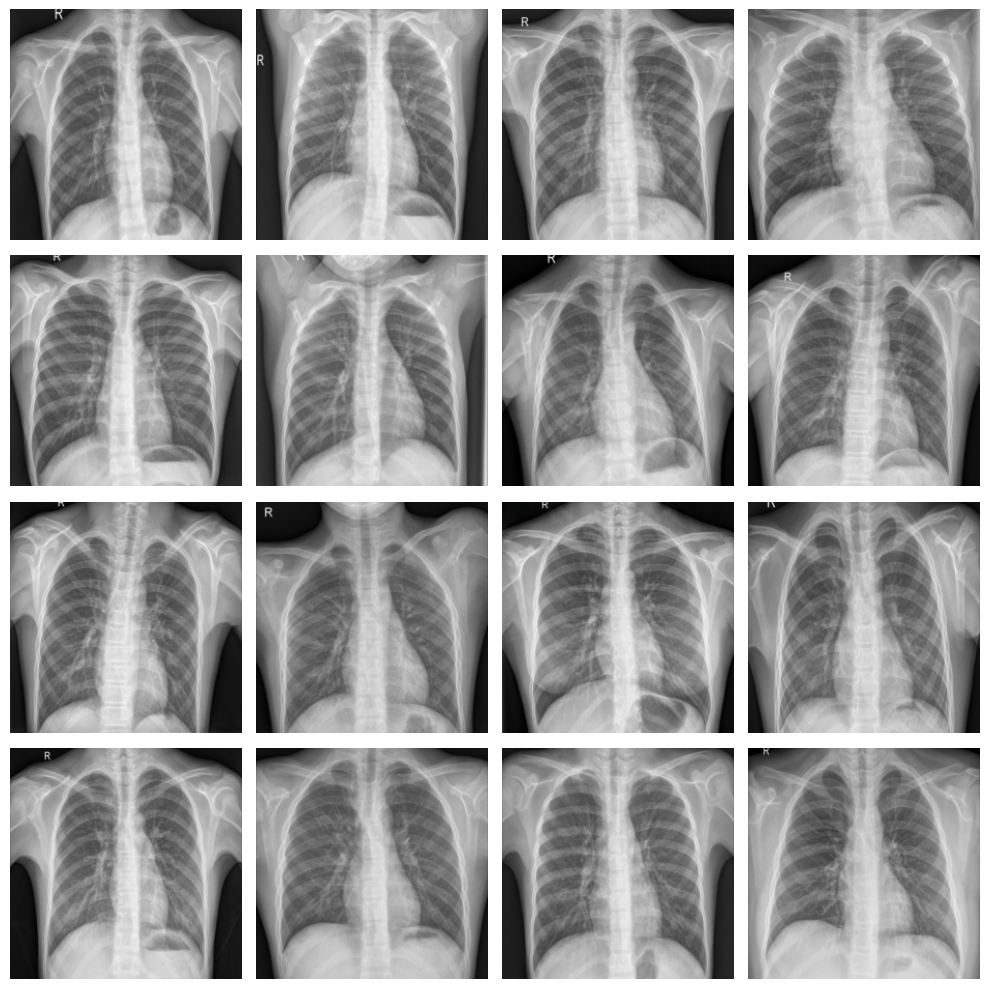

In [ ]:
test_inputs, _ = next(iter(test_dataloader))
imshow(test_inputs, batch_size, cols=4)

# 4.모델링

DenseNet-121, ResNet-50, GoogLeNet(Inception-V3)의 세가지 모델을 사용하겠다.

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Now Using device: {device}")

Now Using device: cpu


## DenseNet-121, ResNet-50, GoogLeNet(Inception-V1)

In [ ]:
# DenseNet-121

densenet = models.densenet121(weights='DenseNet121_Weights.IMAGENET1K_V1')
in_features = densenet.classifier.in_features
densenet.classifier = nn.Linear(in_features, 2)
densenet = densenet.to(device)

Downloading: "https://download.pytorch.org/models/densenet121-a639ec97.pth" to /root/.cache/torch/hub/checkpoints/densenet121-a639ec97.pth
100%|██████████| 30.8M/30.8M [00:00<00:00, 126MB/s]


In [ ]:
densenet

DenseNet(
  (features): Sequential(
    (conv0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (norm0): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu0): ReLU(inplace=True)
    (pool0): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (denseblock1): _DenseBlock(
      (denselayer1): _DenseLayer(
        (norm1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu1): ReLU(inplace=True)
        (conv1): Conv2d(64, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (norm2): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu2): ReLU(inplace=True)
        (conv2): Conv2d(128, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      )
      (denselayer2): _DenseLayer(
        (norm1): BatchNorm2d(96, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu

In [ ]:
# ResNet-50

resnet = models.resnet50(weights='ResNet50_Weights.IMAGENET1K_V1')
in_features = resnet.fc.in_features
resnet.fc = nn.Linear(in_features, 2)
resnet = resnet.to(device)

Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth
100%|██████████| 97.8M/97.8M [00:00<00:00, 149MB/s]


In [ ]:
resnet

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 

In [ ]:
# GoogLeNet(Inception-V1)
googlenet = models.googlenet(weights=models.GoogLeNet_Weights.IMAGENET1K_V1, aux_logits=True)

# 분류기
in_features = googlenet.fc.in_features
googlenet.fc = nn.Linear(in_features, 2)

# 보조 분류기
if googlenet.aux_logits:
    googlenet.aux1.load_state_dict(googlenet.aux1.state_dict(), strict=False)
    googlenet.aux2.load_state_dict(googlenet.aux2.state_dict(), strict=False)

    aux_in_features = googlenet.aux1.fc2.in_features
    googlenet.aux1.fc = nn.Linear(aux_in_features, 2)

    aux_in_features = googlenet.aux2.fc2.in_features
    googlenet.aux2.fc = nn.Linear(aux_in_features, 2)

googlenet = googlenet.to(device)

Downloading: "https://download.pytorch.org/models/googlenet-1378be20.pth" to /root/.cache/torch/hub/checkpoints/googlenet-1378be20.pth
100%|██████████| 49.7M/49.7M [00:01<00:00, 39.5MB/s]
/usr/local/lib/python3.11/dist-packages/torchvision/models/googlenet.py:341: UserWarning: auxiliary heads in the pretrained googlenet model are NOT pretrained, so make sure to train them
  warnings.warn(


In [ ]:
googlenet

GoogLeNet(
  (conv1): BasicConv2d(
    (conv): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn): BatchNorm2d(64, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  )
  (maxpool1): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=True)
  (conv2): BasicConv2d(
    (conv): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn): BatchNorm2d(64, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  )
  (conv3): BasicConv2d(
    (conv): Conv2d(64, 192, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn): BatchNorm2d(192, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  )
  (maxpool2): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=True)
  (inception3a): Inception(
    (branch1): BasicConv2d(
      (conv): Conv2d(192, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn): BatchNorm2d(64, eps=0.001, momentum=0.1, affine=True, track

## Frozen, Partial, Full Fine-tuning

In [ ]:
def model_type(model, mode='frozen'):
    # 분류기만 학습
    if mode == 'frozen':
        for param in model.parameters():
            param.requires_grad = False
        if hasattr(model, 'classifier'):
            for param in model.classifier.parameters():
                param.requires_grad = True
        elif hasattr(model, 'fc'):
            for param in model.fc.parameters():
                param.requires_grad = True
        if hasattr(model, 'aux1') and hasattr(model.aux1, 'fc2'):
            for param in model.aux1.fc.parameters():
                param.requires_grad = True
        if hasattr(model, 'aux2') and hasattr(model.aux2, 'fc2'):
            for param in model.aux2.fc.parameters():
                param.requires_grad = True

        model = model.to(device)

    # 마지막 레이어 학습
    elif mode == 'partial':
        for param in model.parameters():
            param.requires_grad = False

        # DenseNet
        if hasattr(model, 'features') and hasattr(model.features, 'denseblock4'):
            for param in model.features.denseblock4.parameters():
                param.requires_grad = True
            for param in model.classifier.parameters():
                param.requires_grad = True

        # ResNet
        elif hasattr(model, 'layer4'):
            for param in model.layer4.parameters():
                param.requires_grad = True
            for param in model.fc.parameters():
                param.requires_grad = True

        # GoogLeNet
        elif hasattr(model, 'inception5a'):
            for param in model.inception5a.parameters():
                param.requires_grad = True
            for param in model.inception5b.parameters():
                param.requires_grad = True
            for param in model.fc.parameters():
                param.requires_grad = True
            if hasattr(model, 'aux1') and hasattr(model.aux1, 'fc2'):
                for param in model.aux1.fc2.parameters():
                    param.requires_grad = True
            if hasattr(model, 'aux2') and hasattr(model.aux2, 'fc2'):
                for param in model.aux2.fc2.parameters():
                    param.requires_grad = True

        model = model.to(device)

    # 전체 학습
    elif mode == 'full':
        for param in model.parameters():
            param.requires_grad = True
        model = model.to(device)

    return model

In [ ]:
# 학습하는 파라미터 체크
def check_trainable_parameters(model):
    print("Trainable Parameters:")
    for name, param in model.named_parameters():
        if param.requires_grad:
            print(name)

## 학습 검증 시험 함수

In [ ]:
from google.colab import drive
import os

# Google Drive 마운트
drive.mount('/content/drive')

# 모델을 저장할 디렉토리 설정 (예: "My Drive/model_storage/")
model_dir = "/content/drive/My Drive/model_storage/"
os.makedirs(model_dir, exist_ok=True)  # 디렉토리 생성 (이미 존재하면 무시)

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
def train_model(model, trainloader, valloader, optimizer, scheduler, criterion, num_epochs, patience, model_name, train_type):
    # Google Drive 모델 저장 폴더 설정
    model_dir = "/content/drive/My Drive/model_storage/"
    os.makedirs(model_dir, exist_ok=True)  # 폴더 생성 (이미 존재하면 무시)

    # 모델 저장 경로 (예: "/content/drive/My Drive/model_storage/resnet_frozen.pth")
    model_path = os.path.join(model_dir, f"{model_name}_{train_type}.pth")

    train_losses = []
    train_accuracies = []
    val_losses = []
    val_accuracies = []

    epoch = 0
    early_stop_counter = 0

    best_model_state = model.state_dict()
    best_val_loss = float('inf')

    while epoch < num_epochs:
        model.train()
        train_loss = 0
        train_correct = 0
        train_total = 0

        # 학습
        for images, labels in tqdm(trainloader, desc=f"Epoch {epoch+1}/{num_epochs} [Train]", leave=False, dynamic_ncols=True):
            images, labels = images.to(device), labels.to(device)
            optimizer.zero_grad()
            outputs = model(images)

            # GoogLeNet 예외 처리
            if isinstance(outputs, tuple):
                final_logits, aux1_logits, aux2_logits = outputs
                loss = criterion(final_logits, labels) + 0.3 * criterion(aux1_logits, labels) + 0.3 * criterion(aux2_logits, labels)
                _, predicted = torch.max(final_logits, 1)
            else:
                loss = criterion(outputs, labels)
                _, predicted = torch.max(outputs, 1)

            loss.backward()
            optimizer.step()

            train_loss += loss.item()
            train_correct += (predicted == labels).sum().item()
            train_total += labels.size(0)

        train_losses.append(train_loss / len(trainloader))
        train_accuracies.append(train_correct / train_total)

        model.eval()
        val_loss = 0
        val_correct = 0
        val_total = 0

        # 검증
        with torch.no_grad():
            for images, labels in tqdm(valloader, desc="Validation", leave=False, dynamic_ncols=True):
                images, labels = images.to(device), labels.to(device)
                outputs = model(images)

                if isinstance(outputs, tuple):
                    final_logits, aux1_logits, aux2_logits = outputs
                    loss = criterion(final_logits, labels) + 0.3 * criterion(aux1_logits, labels) + 0.3 * criterion(aux2_logits, labels)
                    _, predicted = torch.max(final_logits, 1)
                else:
                    loss = criterion(outputs, labels)
                    _, predicted = torch.max(outputs, 1)

                val_loss += loss.item()
                val_correct += (predicted == labels).sum().item()
                val_total += labels.size(0)

        val_losses.append(val_loss / len(valloader))
        val_accuracies.append(val_correct / val_total)

        print(f"Epoch {epoch+1}/{num_epochs}, Train Loss: {train_losses[-1]:.4f}, Train Acc: {train_accuracies[-1]:.4f}, Val Loss: {val_losses[-1]:.4f}, Val Acc: {val_accuracies[-1]:.4f}")

        # 학습률 스케줄러 적용
        prev_lr = optimizer.param_groups[0]['lr']
        if isinstance(scheduler, torch.optim.lr_scheduler.ReduceLROnPlateau):
            scheduler.step(val_loss)
        else:
            scheduler.step()
        current_lr = optimizer.param_groups[0]['lr']

        if current_lr != prev_lr:
            print(f"Learning Rate Changed: {prev_lr:.6f} -> {current_lr:.6f}")

        # 베스트 모델 업데이트 및 저장
        if (val_loss / len(valloader)) < best_val_loss:
            print(f"New Best Val Loss: {(val_loss / len(valloader)):.4f} (Previous: {best_val_loss:.4f})")
            best_val_loss = (val_loss / len(valloader))
            best_model_state = model.state_dict()
            torch.save(best_model_state, model_path)  # Google Drive에 저장
            early_stop_counter = 0
        else:
            early_stop_counter += 1
            print(f"Early Stop Counter: {early_stop_counter}/{patience}")
            if early_stop_counter >= patience:
                print("Early Stopping")
                break

        epoch += 1

    # 모델 불러오기
    print(f"\nLoading Best Model from {model_path} with val_loss: {best_val_loss:.4f}")
    model.load_state_dict(torch.load(model_path, map_location=device, weights_only=True))
    model = model.to(device)

    return model, train_losses, train_accuracies, val_losses, val_accuracies

In [ ]:
def test_model(model, testloader, criterion):
    test_loss = 0
    all_labels = []
    all_predicted = []

    model.eval()
    with torch.no_grad():
        for images, labels in tqdm(testloader, desc="Test", leave=False, dynamic_ncols=True):
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)

            # GoogLeNet 예외
            if isinstance(outputs, tuple):
                final_logits, _, _ = outputs
                loss = criterion(final_logits, labels)
                _, predicted = torch.max(final_logits, 1)
            else:
                loss = criterion(outputs, labels)
                _, predicted = torch.max(outputs, 1)

            test_loss += loss.item()
            all_labels.extend(labels.cpu().numpy())
            all_predicted.extend(predicted.cpu().numpy())

    # 손실 및 평가지표
    test_loss /= len(testloader)
    accuracy = accuracy_score(all_labels, all_predicted)
    precision = precision_score(all_labels, all_predicted)
    recall = recall_score(all_labels, all_predicted)
    f1 = f1_score(all_labels, all_predicted)

    print(f"{'Test Loss:':<15} {test_loss:>8.4f}")
    print(f"{'Test Accuracy:':<15} {accuracy:>8.4f}")
    print(f"{'Test Precision:':<15} {precision:>8.4f}")
    print(f"{'Test Recall:':<15} {recall:>8.4f}")
    print(f"{'Test F1 Score:':<15} {f1:>8.4f}")

    return all_labels, all_predicted, test_loss, accuracy, precision, recall, f1

In [ ]:
# Google Drive 마운트
drive.mount('/content/drive')

# 모델을 저장한 기본 경로
model_dir = "/content/drive/My Drive/model_storage/"

# 모델 로드 함수
def load_trained_model(model_architecture, model_name, train_type, device):
    """
    저장된 학습된 모델을 Google Drive에서 로드하는 함수.

    Args:
        model_architecture (torch.nn.Module): 모델의 기본 구조 (DenseNet, ResNet, GoogLeNet 등)
        model_name (str): 모델 이름 (예: "densenet", "resnet", "googlenet")
        train_type (str): 학습 방식 ("frozen", "partial", "full")
        device (torch.device): 사용할 디바이스 (CPU/GPU)

    Returns:
        torch.nn.Module: 로드된 모델
    """
    model_path = f"{model_dir}{model_name}_{train_type}.pth"  # 모델 경로 설정

    # 모델 객체 생성 후 가중치 로드
    model = model_architecture  # 동일한 모델 아키텍처 사용
    model.load_state_dict(torch.load(model_path, map_location=device, weights_only=True))  # 가중치 로드
    model = model.to(device)  # GPU/CPU 할당
    model.eval()  # 평가 모드 설정

    print(f"✅ {model_name}_{train_type} 모델이 로드되었습니다!")
    return model

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
from copy import deepcopy

class GradCAM:
    """
    Grad-CAM(Gradient-weighted Class Activation Mapping) 클래스.

    특정 신경망 모델의 마지막 컨볼루션 레이어에서 feature map과 gradient를 추출하여,
    해당 feature map이 예측에 기여한 정도를 시각화하는 역할을 한다.

    Grad-CAM은 다음과 같은 과정으로 동작한다:
    1. 지정한 컨볼루션 레이어에서 forward 및 backward hook을 설정하여,
       - forward 시 feature map을 저장
       - backward 시 gradient를 저장
    2. 입력 이미지에 대해 순전파(forward pass)를 수행하여 예측 결과를 얻는다.
    3. 예측된 클래스에 대해 역전파(backward pass)를 수행하여 gradient를 계산한다.
    4. 저장된 feature map과 gradient를 활용하여 Grad-CAM 히트맵을 생성한다.
    """

    def __init__(self, model, main_layer_name, sub_layer_name):
        """
        Grad-CAM 객체 초기화 함수.

        Args:
            model (torch.nn.Module): 사전 학습된 모델 (ResNet, DenseNet, GoogLeNet 등)
            main_layer_name (str): Grad-CAM을 적용할 주요 레이어의 이름 (예: "layer4", "denseblock4")
            sub_layer_name (str): 주요 레이어 내에서 특정 컨볼루션 층의 이름 (예: "conv2")

        초기화 과정:
        1. 모델을 `eval()` 모드로 설정하여 학습을 비활성화한다.
        2. `register_hook()` 함수를 호출하여 지정된 레이어에 forward/backward hook을 등록한다.
        """
        self.model = deepcopy(model).eval()  # 모델을 평가 모드로 전환하여 BatchNorm, Dropout 등의 영향을 제거
        self.register_hook(main_layer_name, sub_layer_name)  # 관심 있는 레이어에 hook을 등록

    def register_hook(self, main_layer_name, sub_layer_name):
        """
        Grad-CAM을 적용할 컨볼루션 레이어에 forward 및 backward hook을 등록하는 함수.

        Args:
            main_layer_name (str): 주요 컨볼루션 레이어 이름 (예: "layer4")
            sub_layer_name (str): 주요 레이어 내의 특정 서브 레이어 이름 (예: "conv2")

        동작 과정:
        1. 모델의 `named_modules()`을 활용하여 main_layer_name에 해당하는 모듈을 찾는다.
        2. main_layer 내부의 모든 서브 모듈을 탐색하여, sub_layer_name과 일치하는 모듈을 찾는다.
        3. 해당 모듈에 forward 및 backward hook을 등록한다.
        4. 만약 지정된 sub_layer_name이 존재하지 않으면 오류를 발생시킨다.
        """
        # 모델 내 모든 모듈(레이어)에서 main_layer_name과 일치하는 레이어 찾기
        main_layer = dict(self.model.named_modules()).get(main_layer_name, None)
        if main_layer is None:
            raise ValueError(f"'{main_layer_name}' 레이어를 찾을 수 없습니다.")  # main_layer가 존재하지 않으면 오류 발생

        # main_layer 내 모든 서브 모듈 탐색
        for name, module in main_layer.named_modules():
            if sub_layer_name in name:  # sub_layer_name이 포함된 서브 모듈이 있는지 확인
                module.register_forward_hook(self.forward_hook)  # forward hook 등록
                module.register_full_backward_hook(self.backward_hook)  # backward hook 등록
                print(f"✅ Hook registered at: {name}")  # Hook이 등록되었는지 확인하기 위한 디버깅 메시지
                return

        # sub_layer_name이 main_layer 내부에 존재하지 않으면 오류 발생
        raise ValueError(f"'{sub_layer_name}' 레이어를 '{main_layer_name}'에서 찾을 수 없습니다.")

    def forward_hook(self, module, input, output):
        """
        forward hook: 모델이 forward할 때 호출되는 함수.

        Args:
            module (torch.nn.Module): forward hook이 등록된 모듈.
            input (tuple): 입력 텐서.
            output (torch.Tensor): forward 수행 결과 (feature map).

        역할:
        1. forward 과정에서 생성된 feature map을 저장한다.
        2. Grad-CAM 연산에서 이 feature map을 활용하여 최종 히트맵을 생성한다.
        """
        self.feature_map = output  # forward 과정에서 feature map 저장

    def backward_hook(self, module, grad_input, grad_output):
        """
        backward hook: 모델이 backward할 때 호출되는 함수.

        Args:
            module (torch.nn.Module): backward hook이 등록된 모듈.
            grad_input (tuple): 입력 텐서의 gradient.
            grad_output (tuple): 출력 텐서의 gradient.

        역할:
        1. 역전파(backward) 과정에서 계산된 gradient를 저장한다.
        2. 해당 gradient는 Grad-CAM에서 feature map의 중요도를 결정하는 데 사용된다.
        """
        self.gradient = grad_output[0] if isinstance(grad_output, tuple) else grad_output  # gradient 저장(GoogLeNet 예외)

    def __call__(self, x):
        """
        입력 이미지에 대해 Grad-CAM을 계산하는 함수.

        Args:
            x (torch.Tensor): 입력 이미지 텐서 (배치 형태)

        Returns:
            grad_cam (torch.Tensor): 각 이미지에 대한 Grad-CAM 결과 (공간적 크기: feature map)

        동작 과정:
        1. 입력 이미지를 모델에 전달하여 순전파(forward pass)를 수행하고 예측 결과를 얻는다.
        2. 예측된 클래스에 대해 one-hot 벡터를 생성하여 역전파(backward pass)를 수행한다.
        3. 저장된 gradient를 기반으로 채널별 중요도를 계산한다.
        4. 계산된 중요도를 활용하여 Grad-CAM 히트맵을 생성한다.
        """
        output = self.model(x)  # 모델의 forward 연산 수행하여 예측값 출력

        indices = output.argmax(dim=1)  # 배치 내 각 샘플에 대해 가장 높은 확률을 가진 클래스 인덱스 찾기

        one_hot = torch.zeros_like(output)  # one-hot 벡터 초기화
        for i in range(output.size(0)):  # 배치 내 각 샘플에 대해 실행
            one_hot[i, indices[i]] = 1  # 예측된 클래스 인덱스에 1을 설정 (one-hot encoding)

        self.model.zero_grad()  # 기존 gradient 초기화
        output.backward(gradient=one_hot, retain_graph=True)  # 역전파 수행하여 gradient 계산

        # 저장된 gradient의 채널별 중요도(weight) 계산 (Global Average Pooling)
        a_k = torch.mean(self.gradient, dim=(2, 3), keepdim=True)  # H x W에 대해 평균 연산

        # feature map에 weight를 적용하여 Grad-CAM 생성
        grad_cam = torch.sum(a_k * self.feature_map, dim=1)  # 채널별 가중합 수행

        # ReLU 적용 (음수 값을 제거하여 중요 영역만 남김)
        grad_cam = torch.relu(grad_cam)

        return grad_cam  # Grad-CAM 결과 반환

In [ ]:
import torch  # PyTorch 라이브러리
import torch.nn.functional as F  # PyTorch의 다양한 연산 함수 (F.interpolate 사용)
import numpy as np  # 배열 연산을 위한 numpy
import matplotlib.pyplot as plt  # 그래프 및 이미지 시각화를 위한 라이브러리
import cv2  # OpenCV를 사용하여 Grad-CAM 히트맵을 색상 변환

def visualize_cam(model, testloader, main_layer, sub_layer, max_attempts=50):
    """
    Grad-CAM을 이용하여 CNN 모델이 예측한 결과를 시각화하는 함수.

    Args:
        model (torch.nn.Module): 학습된 CNN 모델
        testloader (torch.utils.data.DataLoader): 테스트 데이터셋 로더
        main_layer (str): Grad-CAM을 적용할 주요 레이어 이름
        sub_layer (str): 주요 레이어 내 특정 컨볼루션 층 이름
        max_attempts (int): 4가지 케이스를 확보하기 위한 최대 반복 횟수 (기본값: 50)
    """

    grad_cam = GradCAM(model, main_layer, sub_layer)  # Grad-CAM 객체 생성
    model.eval()  # 모델을 평가 모드로 설정하여 Dropout, BatchNorm 등의 영향을 제거

    # 네 가지 경우의 샘플을 저장할 딕셔너리 (각 경우에 해당하는 이미지 인덱스를 저장)
    selected_idxs = {
        "normal_normal": None,       # 정상 이미지를 정상으로 예측한 경우
        "normal_pneumonia": None,    # 정상 이미지를 폐렴으로 잘못 예측한 경우
        "pneumonia_pneumonia": None, # 폐렴 이미지를 폐렴으로 예측한 경우
        "pneumonia_normal": None     # 폐렴 이미지를 정상으로 잘못 예측한 경우
    }

    attempt = 0  # 배치 처리 횟수 추적
    found_samples = 0  # 찾은 샘플 개수

    # `testloader`를 전체 순회하여 샘플 찾음
    for images, labels in testloader:
        attempt += 1  # 배치 처리 카운트 증가
        images, labels = images.to(device), labels.to(device)  # GPU 또는 CPU로 데이터 이동

        outputs = model(images)  # 모델을 사용하여 예측 수행
        _, predicted = torch.max(outputs, 1)  # 가장 높은 확률을 가진 클래스 선택

        for i in range(len(labels)):  # 배치 내 모든 샘플 검사
            if labels[i] == 0 and predicted[i] == 0 and selected_idxs["normal_normal"] is None:
                selected_idxs["normal_normal"] = (images[i], labels[i], predicted[i])
                found_samples += 1
            elif labels[i] == 0 and predicted[i] == 1 and selected_idxs["normal_pneumonia"] is None:
                selected_idxs["normal_pneumonia"] = (images[i], labels[i], predicted[i])
                found_samples += 1
            elif labels[i] == 1 and predicted[i] == 1 and selected_idxs["pneumonia_pneumonia"] is None:
                selected_idxs["pneumonia_pneumonia"] = (images[i], labels[i], predicted[i])
                found_samples += 1
            elif labels[i] == 1 and predicted[i] == 0 and selected_idxs["pneumonia_normal"] is None:
                selected_idxs["pneumonia_normal"] = (images[i], labels[i], predicted[i])
                found_samples += 1

        # 4가지 경우를 모두 찾았으면 반복 종료
        if found_samples == 4:
            break

        # 최대 시도 횟수를 초과하면 중단
        if attempt >= max_attempts:
            break

    print(f"샘플 확보 완료 (시도 횟수: {attempt}/{max_attempts})")

    fig, axes = plt.subplots(4, 3, figsize=(10, 15))  # 4행 3열의 서브플롯 생성 (각 행: 한 가지 케이스)
    fig.subplots_adjust(hspace=0.3)  # 행 간 간격 조정

    titles = [
        "True: Normal, Pred: Normal",
        "True: Normal, Pred: Pneumonia",
        "True: Pneumonia, Pred: Pneumonia",
        "True: Pneumonia, Pred: Normal"
    ]

    # 확보한 샘플을 순회하면서 시각화 수행
    for i, (key, sample) in enumerate(selected_idxs.items()):
        if sample is None:  # 해당 케이스에 샘플이 없을 경우 빈 칸 표시
            axes[i, 0].set_title(titles[i] + " (No Sample)")
            axes[i, 0].axis("off")
            axes[i, 1].axis("off")
            axes[i, 2].axis("off")
            continue  # 다음 샘플로 이동

        image, true_label, pred_label = sample  # 선택된 이미지, 실제 레이블, 예측 레이블 가져오기
        cam = grad_cam(image.unsqueeze(0))  # Grad-CAM 실행 (배치 차원을 추가하여 입력)

        orig_img = image.cpu().numpy().transpose(1, 2, 0)  # PyTorch의 (C, H, W) 형식을 (H, W, C)로 변환
        orig_img = (orig_img - np.min(orig_img)) / (np.max(orig_img) - np.min(orig_img))  # 0~1 범위로 정규화

        if len(cam.shape) == 3:  # Grad-CAM이 여러 채널을 가질 경우 평균 대신 최대값을 사용하여 정보 손실 방지
            cam = cam.max(dim=0, keepdim=True)[0]  # 평균 대신 max() 사용

        cam_resized = F.interpolate(
            cam.unsqueeze(1),  # (H, W) → (1, C, H, W)로 변경
            size=(orig_img.shape[0], orig_img.shape[1]),  # 원본 이미지 크기로 조정
            mode="bilinear",
            align_corners=True  # align_corners=True로 변경하여 확대 시 정보 손실 방지
        ).squeeze().detach().cpu().numpy()  # 다시 (H, W)로 변환

        cam_resized = np.clip(cam_resized, 0, 1)  # 값의 범위를 0~1로 조정하여 왜곡 방지

        heatmap = cv2.applyColorMap(np.uint8(255 * cam_resized), cv2.COLORMAP_JET)  # 컬러맵 적용 (빨간색이 강한 활성화 영역)
        heatmap = heatmap / 255.0  # 0~1 범위로 다시 변환

        overlay = 0.5 * heatmap + 0.5 * orig_img  # 원본 이미지와 Grad-CAM 히트맵을 오버레이

        axes[i, 0].imshow(orig_img)  # 첫 번째 열: 원본 이미지
        axes[i, 0].set_title(titles[i])
        axes[i, 0].axis("off")

        axes[i, 1].imshow(heatmap)  # 두 번째 열: Grad-CAM 히트맵
        axes[i, 1].set_title("Grad-CAM")
        axes[i, 1].axis("off")

        axes[i, 2].imshow(overlay)  # 세 번째 열: 원본 이미지 + Grad-CAM 히트맵 오버레이
        axes[i, 2].set_title("Overlay")
        axes[i, 2].axis("off")

    plt.show()  # 최종 시각화 출력

# 5.학습 및 검증하기

## Frozen

### DenseNet

In [ ]:
# DenseNet
densenet_frozen = model_type(densenet, mode='frozen')

In [ ]:
check_trainable_parameters(densenet_frozen)

Trainable Parameters:
classifier.weight
classifier.bias


In [ ]:
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.AdamW(densenet_frozen.classifier.parameters(), lr=1e-3, weight_decay=1e-4)
scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=3, gamma=0.1)
num_epochs = 7
patience = 3

In [ ]:
densenet_frozen, densenet_frozen_train_loss, densenet_frozen_train_acc, densenet_frozen_val_loss, densenet_frozen_val_acc = train_model(
    model=densenet,
    trainloader=train_dataloader,
    valloader=val_dataloader,
    optimizer=optimizer,
    scheduler=scheduler,
    criterion=criterion,
    num_epochs=num_epochs,
    patience=patience,
    model_name="densenet",
    train_type="frozen"
)

Epoch 1/7, Train Loss: 0.2822, Train Acc: 0.8846, Val Loss: 0.1696, Val Acc: 0.9408
New Best Val Loss: 0.1696 (Previous: inf)


Epoch 2/7, Train Loss: 0.1694, Train Acc: 0.9338, Val Loss: 0.1464, Val Acc: 0.9465
New Best Val Loss: 0.1464 (Previous: 0.1696)


Epoch 3/7, Train Loss: 0.1688, Train Acc: 0.9345, Val Loss: 0.1455, Val Acc: 0.9522
Learning Rate Changed: 0.001000 -> 0.000100
New Best Val Loss: 0.1455 (Previous: 0.1464)


Epoch 4/7, Train Loss: 0.1342, Train Acc: 0.9508, Val Loss: 0.1568, Val Acc: 0.9494
Early Stop Counter: 1/3


Epoch 5/7, Train Loss: 0.1450, Train Acc: 0.9441, Val Loss: 0.1544, Val Acc: 0.9503
Early Stop Counter: 2/3


Epoch 6/7, Train Loss: 0.1422, Train Acc: 0.9398, Val Loss: 0.1477, Val Acc: 0.9513
Learning Rate Changed: 0.000100 -> 0.000010
Early Stop Counter: 3/3
Early Stopping

Loading Best Model from /content/drive/My Drive/model_storage/densenet_frozen.pth with val_loss: 0.1455


In [ ]:
model_name = "densenet"
train_type = "frozen"
densenet_frozen = load_trained_model(densenet, model_name, train_type, device)
densenet_frozen = model_type(densenet_frozen, mode='frozen')

✅ densenet_frozen 모델이 로드되었습니다!


In [ ]:
(
    densenet_frozen_all_labels,
    densenet_frozen_all_predicted,
    densenet_frozen_test_loss,
    densenet_frozen_accuracy,
    densenet_frozen_precision,
    densenet_frozen_recall,
    densenet_frozen_f1
) = test_model(densenet_frozen, test_dataloader, criterion)

Test Loss:        0.3307
Test Accuracy:    0.8638
Test Precision:   0.8412
Test Recall:      0.9641
Test F1 Score:    0.8984


✅ Hook registered at: denselayer16.conv2
샘플 확보 완료 (시도 횟수: 16/39)


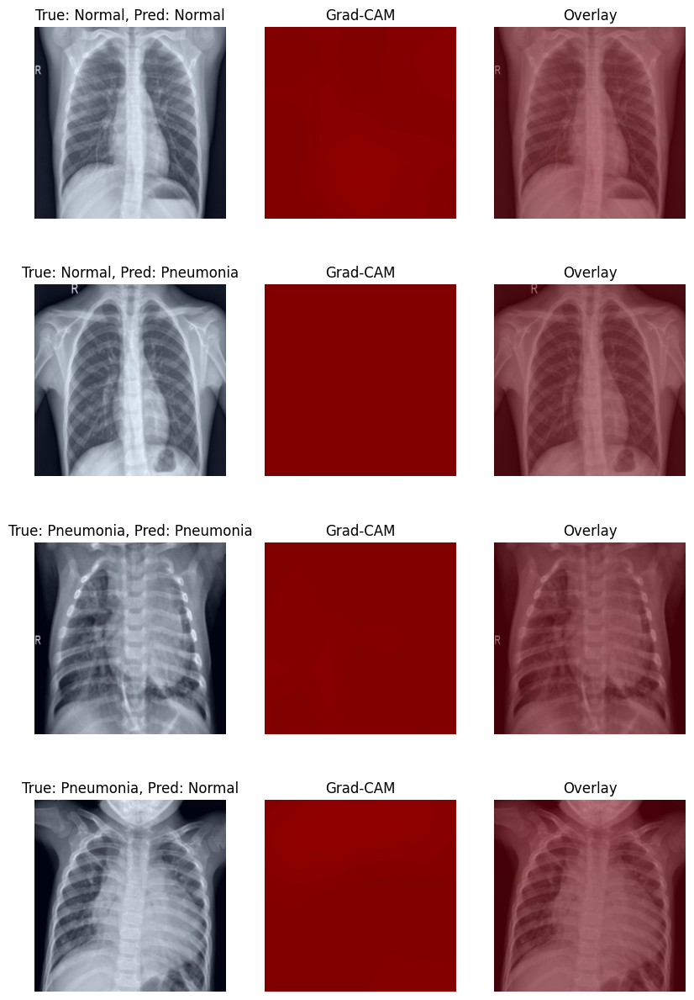

In [ ]:
# 1️모든 파라미터 활성화
for param in densenet_frozen.parameters():
    param.requires_grad = True

# Grad-CAM
main_layer = "features.denseblock4"
sub_layer = "denselayer16.conv2"
visualize_cam(densenet_frozen, test_dataloader, main_layer, sub_layer, max_attempts=39)

# 모델 원상복구
densenet_frozen = model_type(densenet_frozen, mode='frozen')

### ResNet

In [ ]:
# ResNet
resnet_frozen = model_type(resnet, mode='frozen')

In [ ]:
check_trainable_parameters(resnet_frozen)

Trainable Parameters:
fc.weight
fc.bias


In [ ]:
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.AdamW(resnet_frozen.fc.parameters(), lr=1e-3, weight_decay=1e-4)
scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=3, gamma=0.1)
num_epochs = 7
patience = 3

In [ ]:
resnet_frozen, resnet_frozen_train_loss, resnet_frozen_train_acc, resnet_frozen_val_loss, resnet_frozen_val_acc = train_model(
    model=resnet,
    trainloader=train_dataloader,
    valloader=val_dataloader,
    optimizer=optimizer,
    scheduler=scheduler,
    criterion=criterion,
    num_epochs=num_epochs,
    patience=patience,
    model_name="resnet",
    train_type="frozen"
)

Epoch 1/7, Train Loss: 0.2533, Train Acc: 0.8922, Val Loss: 0.2322, Val Acc: 0.9074
New Best Val Loss: 0.2322 (Previous: inf)


Epoch 2/7, Train Loss: 0.1761, Train Acc: 0.9283, Val Loss: 0.1448, Val Acc: 0.9446
New Best Val Loss: 0.1448 (Previous: 0.2322)


Epoch 3/7, Train Loss: 0.1507, Train Acc: 0.9384, Val Loss: 0.1774, Val Acc: 0.9370
Learning Rate Changed: 0.001000 -> 0.000100
Early Stop Counter: 1/3


Epoch 4/7, Train Loss: 0.1335, Train Acc: 0.9491, Val Loss: 0.1487, Val Acc: 0.9427
Early Stop Counter: 2/3


Epoch 5/7, Train Loss: 0.1341, Train Acc: 0.9481, Val Loss: 0.1459, Val Acc: 0.9456
Early Stop Counter: 3/3
Early Stopping

Loading Best Model from /content/drive/My Drive/model_storage/resnet_frozen.pth with val_loss: 0.1448


In [ ]:
model_name = "resnet"
train_type = "frozen"
resnet_frozen = load_trained_model(resnet, model_name, train_type, device)
resnet_frozen = model_type(resnet_frozen, mode='frozen')

✅ resnet_frozen 모델이 로드되었습니다!


In [ ]:
(
    resnet_frozen_all_labels,
    resnet_frozen_all_predicted,
    resnet_frozen_test_loss,
    resnet_frozen_accuracy,
    resnet_frozen_precision,
    resnet_frozen_recall,
    resnet_frozen_f1
) = test_model(resnet_frozen, test_dataloader, criterion)

Test Loss:        0.3950
Test Accuracy:    0.8462
Test Precision:   0.8182
Test Recall:      0.9692
Test F1 Score:    0.8873


✅ Hook registered at: 2.conv3
샘플 확보 완료 (시도 횟수: 16/39)


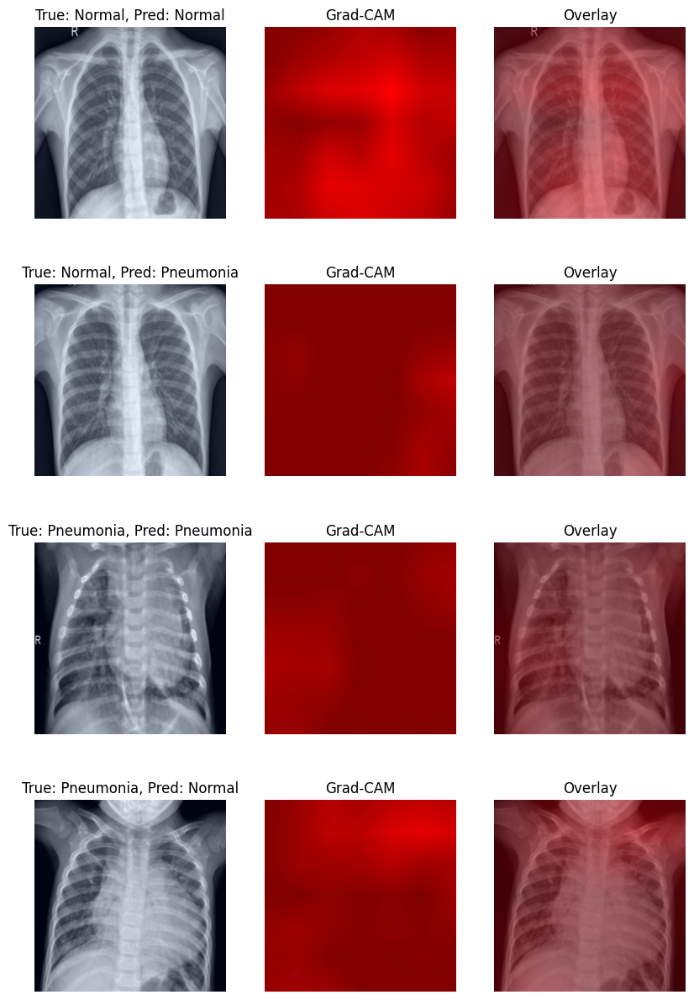

In [ ]:
# 1️모든 파라미터 활성화
for param in resnet_frozen.parameters():
    param.requires_grad = True

# Grad-CAM
main_layer = "layer4"
sub_layer = "2.conv3"
visualize_cam(resnet_frozen, test_dataloader, main_layer, sub_layer, max_attempts=39)

# 모델 원상복구
resnet_frozen = model_type(resnet_frozen, mode='frozen')

### GoogLeNet

In [ ]:
# GoogLenet
googlenet_frozen = model_type(googlenet, mode='frozen')

In [ ]:
check_trainable_parameters(googlenet_frozen)

Trainable Parameters:
aux1.fc.weight
aux1.fc.bias
aux2.fc.weight
aux2.fc.bias
fc.weight
fc.bias


In [ ]:
# 에폭 10~15, 페이션스 3~5

criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.AdamW(googlenet_frozen.fc.parameters(), lr=1e-3, weight_decay=1e-4)
scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=3, gamma=0.1)
num_epochs = 7
patience = 3

In [ ]:
googlenet_frozen, googlenet_frozen_train_loss, googlenet_frozen_train_acc, googlenet_frozen_val_loss, googlenet_frozen_val_acc = train_model(
    model=googlenet,
    trainloader=train_dataloader,
    valloader=val_dataloader,
    optimizer=optimizer,
    scheduler=scheduler,
    criterion=criterion,
    num_epochs=num_epochs,
    patience=patience,
    model_name="googlenet",
    train_type="frozen"
)

Epoch 1/7, Train Loss: 4.9277, Train Acc: 0.8648, Val Loss: 0.2005, Val Acc: 0.9274
New Best Val Loss: 0.2005 (Previous: inf)


Epoch 2/7, Train Loss: 4.8304, Train Acc: 0.9137, Val Loss: 0.2330, Val Acc: 0.9169
Early Stop Counter: 1/3


Epoch 3/7, Train Loss: 4.8169, Train Acc: 0.9192, Val Loss: 0.1655, Val Acc: 0.9274
Learning Rate Changed: 0.001000 -> 0.000100
New Best Val Loss: 0.1655 (Previous: 0.2005)


Epoch 4/7, Train Loss: 4.7842, Train Acc: 0.9247, Val Loss: 0.1501, Val Acc: 0.9484
New Best Val Loss: 0.1501 (Previous: 0.1655)


Epoch 5/7, Train Loss: 4.7973, Train Acc: 0.9326, Val Loss: 0.1640, Val Acc: 0.9446
Early Stop Counter: 1/3


Epoch 6/7, Train Loss: 4.7896, Train Acc: 0.9341, Val Loss: 0.1525, Val Acc: 0.9456
Learning Rate Changed: 0.000100 -> 0.000010
Early Stop Counter: 2/3


Epoch 7/7, Train Loss: 4.7962, Train Acc: 0.9321, Val Loss: 0.1474, Val Acc: 0.9475
New Best Val Loss: 0.1474 (Previous: 0.1501)

Loading Best Model from /content/drive/My Drive/model_storage/googlenet_frozen.pth with val_loss: 0.1474


In [ ]:
model_name = "googlenet"
train_type = "frozen"
googlenet_frozen = load_trained_model(googlenet, model_name, train_type, device)
googlenet_frozen = model_type(googlenet_frozen, mode='frozen')

✅ googlenet_frozen 모델이 로드되었습니다!


In [ ]:
(
    googlenet_frozen_all_labels,
    googlenet_frozen_all_predicted,
    googlenet_frozen_test_loss,
    googlenet_frozen_accuracy,
    googlenet_frozen_precision,
    googlenet_frozen_recall,
    googlenet_frozen_f1
) = test_model(googlenet_frozen, test_dataloader, criterion)

Test Loss:        0.3330
Test Accuracy:    0.8606
Test Precision:   0.8330
Test Recall:      0.9718
Test F1 Score:    0.8970


✅ Hook registered at: branch2.1.conv
샘플 확보 완료 (시도 횟수: 18/39)


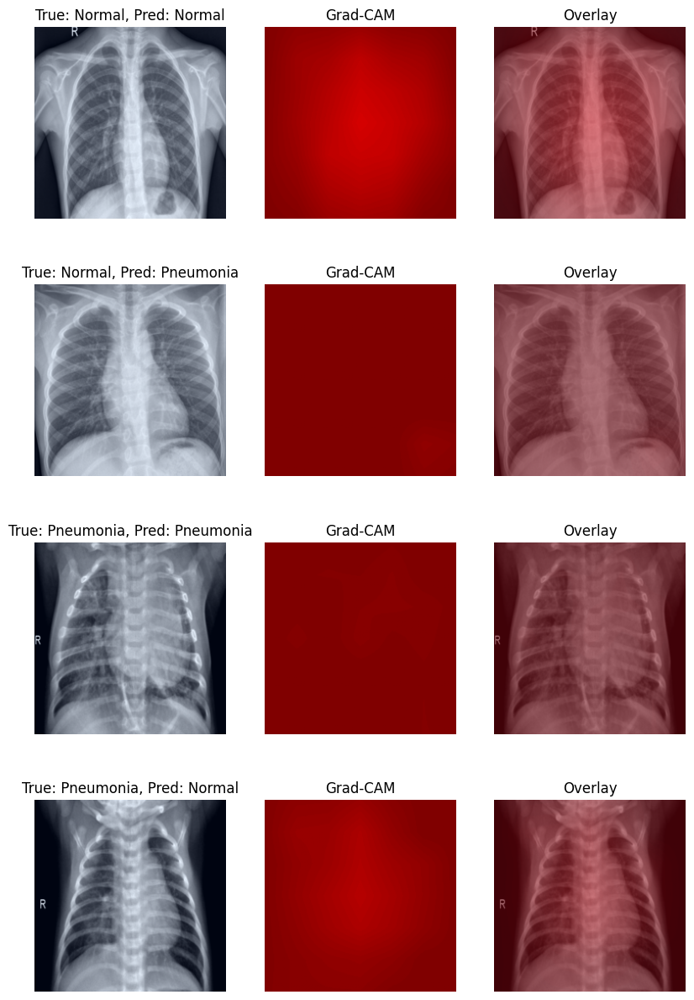

In [ ]:
# 1️모든 파라미터 활성화
for param in googlenet_frozen.parameters():
    param.requires_grad = True

# Grad-CAM
main_layer = "inception5b"
sub_layer = "branch2.1.conv"
visualize_cam(googlenet_frozen, test_dataloader, main_layer, sub_layer, max_attempts=39)

# 모델 원상복구
googlenet_frozen = model_type(googlenet_frozen, mode='frozen')

### 시각화

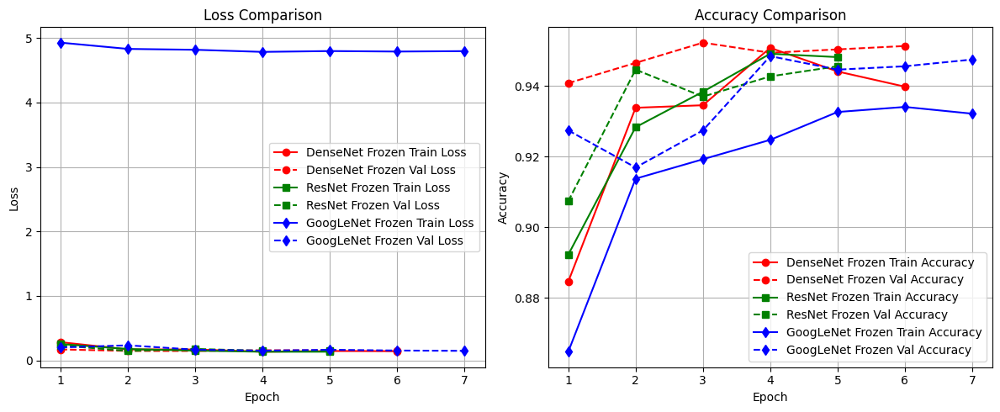

In [ ]:
def pad_to_length(lst, target_length):
    return np.pad(lst, (0, target_length - len(lst)), mode='constant', constant_values=np.nan)

# 모든 모델의 최대 에포크 수 설정 (기준값: num_epochs)
max_epochs = num_epochs

# 모든 모델의 길이를 맞추기 위해 NaN 패딩 적용
densenet_frozen_train_loss_padded = pad_to_length(densenet_frozen_train_loss, max_epochs)
densenet_frozen_val_loss_padded = pad_to_length(densenet_frozen_val_loss, max_epochs)
resnet_frozen_train_loss_padded = pad_to_length(resnet_frozen_train_loss, max_epochs)
resnet_frozen_val_loss_padded = pad_to_length(resnet_frozen_val_loss, max_epochs)
googlenet_frozen_train_loss_padded = pad_to_length(googlenet_frozen_train_loss, max_epochs)
googlenet_frozen_val_loss_padded = pad_to_length(googlenet_frozen_val_loss, max_epochs)

densenet_frozen_train_acc_padded = pad_to_length(densenet_frozen_train_acc, max_epochs)
densenet_frozen_val_acc_padded = pad_to_length(densenet_frozen_val_acc, max_epochs)
resnet_frozen_train_acc_padded = pad_to_length(resnet_frozen_train_acc, max_epochs)
resnet_frozen_val_acc_padded = pad_to_length(resnet_frozen_val_acc, max_epochs)
googlenet_frozen_train_acc_padded = pad_to_length(googlenet_frozen_train_acc, max_epochs)
googlenet_frozen_val_acc_padded = pad_to_length(googlenet_frozen_val_acc, max_epochs)

# 시각화
plt.figure(figsize=(12, 5))

# Loss 그래프
plt.subplot(1, 2, 1)
plt.plot(range(1, max_epochs + 1), densenet_frozen_train_loss_padded, 'o-', c='r', label='DenseNet Frozen Train Loss')
plt.plot(range(1, max_epochs + 1), densenet_frozen_val_loss_padded, 'o--', c='r', label='DenseNet Frozen Val Loss')
plt.plot(range(1, max_epochs + 1), resnet_frozen_train_loss_padded, 's-', c='g', label='ResNet Frozen Train Loss')
plt.plot(range(1, max_epochs + 1), resnet_frozen_val_loss_padded, 's--', c='g', label='ResNet Frozen Val Loss')
plt.plot(range(1, max_epochs + 1), googlenet_frozen_train_loss_padded, 'd-', c='b', label='GoogLeNet Frozen Train Loss')
plt.plot(range(1, max_epochs + 1), googlenet_frozen_val_loss_padded, 'd--', c='b', label='GoogLeNet Frozen Val Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Loss Comparison')
plt.legend()
plt.grid(True)

# Accuracy 그래프
plt.subplot(1, 2, 2)
plt.plot(range(1, max_epochs + 1), densenet_frozen_train_acc_padded, 'o-', c='r', label='DenseNet Frozen Train Accuracy')
plt.plot(range(1, max_epochs + 1), densenet_frozen_val_acc_padded, 'o--', c='r', label='DenseNet Frozen Val Accuracy')
plt.plot(range(1, max_epochs + 1), resnet_frozen_train_acc_padded, 's-', c='g', label='ResNet Frozen Train Accuracy')
plt.plot(range(1, max_epochs + 1), resnet_frozen_val_acc_padded, 's--', c='g', label='ResNet Frozen Val Accuracy')
plt.plot(range(1, max_epochs + 1), googlenet_frozen_train_acc_padded, 'd-', c='b', label='GoogLeNet Frozen Train Accuracy')
plt.plot(range(1, max_epochs + 1), googlenet_frozen_val_acc_padded, 'd--', c='b', label='GoogLeNet Frozen Val Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Accuracy Comparison')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()

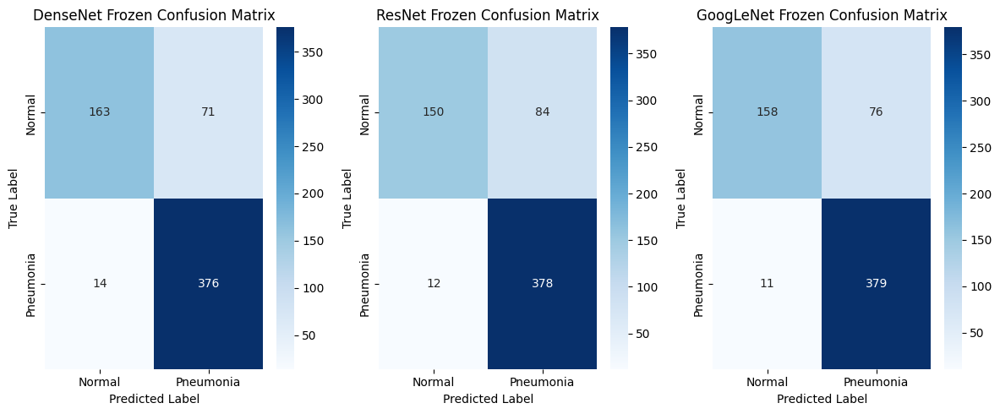

In [ ]:
plt.figure(figsize=(12, 5))

# DenseNet
plt.subplot(1, 3, 1)
densenet_frozen_confusion_matrix = confusion_matrix(densenet_frozen_all_labels, densenet_frozen_all_predicted)
sns.heatmap(densenet_frozen_confusion_matrix, annot=True, fmt="d", cmap="Blues", xticklabels=["Normal", "Pneumonia"], yticklabels=["Normal", "Pneumonia"])
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("DenseNet Frozen Confusion Matrix")

# ResNet
plt.subplot(1, 3, 2)
resnet_frozen_confusion_matrix = confusion_matrix(resnet_frozen_all_labels, resnet_frozen_all_predicted)
sns.heatmap(resnet_frozen_confusion_matrix, annot=True, fmt="d", cmap="Blues", xticklabels=["Normal", "Pneumonia"], yticklabels=["Normal", "Pneumonia"])
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("ResNet Frozen Confusion Matrix")

# GoogLeNet
plt.subplot(1, 3, 3)
googlenet_frozen_confusion_matrix = confusion_matrix(googlenet_frozen_all_labels, googlenet_frozen_all_predicted)
sns.heatmap(googlenet_frozen_confusion_matrix, annot=True, fmt="d", cmap="Blues", xticklabels=["Normal", "Pneumonia"], yticklabels=["Normal", "Pneumonia"])
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("GoogLeNet Frozen Confusion Matrix")

plt.tight_layout()
plt.show()

## Partial

### DenseNet

In [ ]:
densenet_partial = model_type(densenet, mode='partial')

In [ ]:
check_trainable_parameters(densenet_partial)

Trainable Parameters:
features.denseblock4.denselayer1.norm1.weight
features.denseblock4.denselayer1.norm1.bias
features.denseblock4.denselayer1.conv1.weight
features.denseblock4.denselayer1.norm2.weight
features.denseblock4.denselayer1.norm2.bias
features.denseblock4.denselayer1.conv2.weight
features.denseblock4.denselayer2.norm1.weight
features.denseblock4.denselayer2.norm1.bias
features.denseblock4.denselayer2.conv1.weight
features.denseblock4.denselayer2.norm2.weight
features.denseblock4.denselayer2.norm2.bias
features.denseblock4.denselayer2.conv2.weight
features.denseblock4.denselayer3.norm1.weight
features.denseblock4.denselayer3.norm1.bias
features.denseblock4.denselayer3.conv1.weight
features.denseblock4.denselayer3.norm2.weight
features.denseblock4.denselayer3.norm2.bias
features.denseblock4.denselayer3.conv2.weight
features.denseblock4.denselayer4.norm1.weight
features.denseblock4.denselayer4.norm1.bias
features.denseblock4.denselayer4.conv1.weight
features.denseblock4.dense

In [ ]:
trainable_params = [p for p in densenet_partial.parameters() if p.requires_grad]
optimizer = torch.optim.AdamW(trainable_params, lr=1e-3, weight_decay=1e-4)
criterion = nn.CrossEntropyLoss()
scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=7, eta_min=1e-6)

num_epochs = 15
patience = 7

In [ ]:
densenet_partial, densenet_partial_train_loss, densenet_partial_train_acc, densenet_partial_val_loss, densenet_partial_val_acc = train_model(
    model=densenet,
    trainloader=train_dataloader,
    valloader=val_dataloader,
    optimizer=optimizer,
    scheduler=scheduler,
    criterion=criterion,
    num_epochs=num_epochs,
    patience=patience,
    model_name="densenet",
    train_type="partial"
)

Epoch 1/15, Train Loss: 0.0565, Train Acc: 0.9799, Val Loss: 0.0325, Val Acc: 0.9876
Learning Rate Changed: 0.001000 -> 0.000951
New Best Val Loss: 0.0325 (Previous: inf)


Epoch 2/15, Train Loss: 0.0390, Train Acc: 0.9840, Val Loss: 0.0328, Val Acc: 0.9895
Learning Rate Changed: 0.000951 -> 0.000812
Early Stop Counter: 1/7


Epoch 3/15, Train Loss: 0.0309, Train Acc: 0.9895, Val Loss: 0.0300, Val Acc: 0.9914
Learning Rate Changed: 0.000812 -> 0.000612
New Best Val Loss: 0.0300 (Previous: 0.0325)


Epoch 4/15, Train Loss: 0.0304, Train Acc: 0.9892, Val Loss: 0.0332, Val Acc: 0.9885
Learning Rate Changed: 0.000612 -> 0.000389
Early Stop Counter: 1/7


KeyboardInterrupt: 

In [ ]:
model_name = "densenet"
train_type = "partial"
densenet_partial = load_trained_model(densenet, model_name, train_type, device)
densenet_partial = model_type(densenet_partial, mode='partial')

✅ densenet_partial 모델이 로드되었습니다!


In [ ]:
(
    densenet_partial_all_labels,
    densenet_partial_all_predicted,
    densenet_partial_test_loss,
    densenet_partial_accuracy,
    densenet_partial_precision,
    densenet_partial_recall,
    densenet_partial_f1
) = test_model(densenet_partial, test_dataloader, criterion)

Test Loss:        1.4693
Test Accuracy:    0.7740
Test Precision:   0.7345
Test Recall:      1.0000
Test F1 Score:    0.8469


✅ Hook registered at: denselayer16.conv2
샘플 확보 완료 (시도 횟수: 39/39)


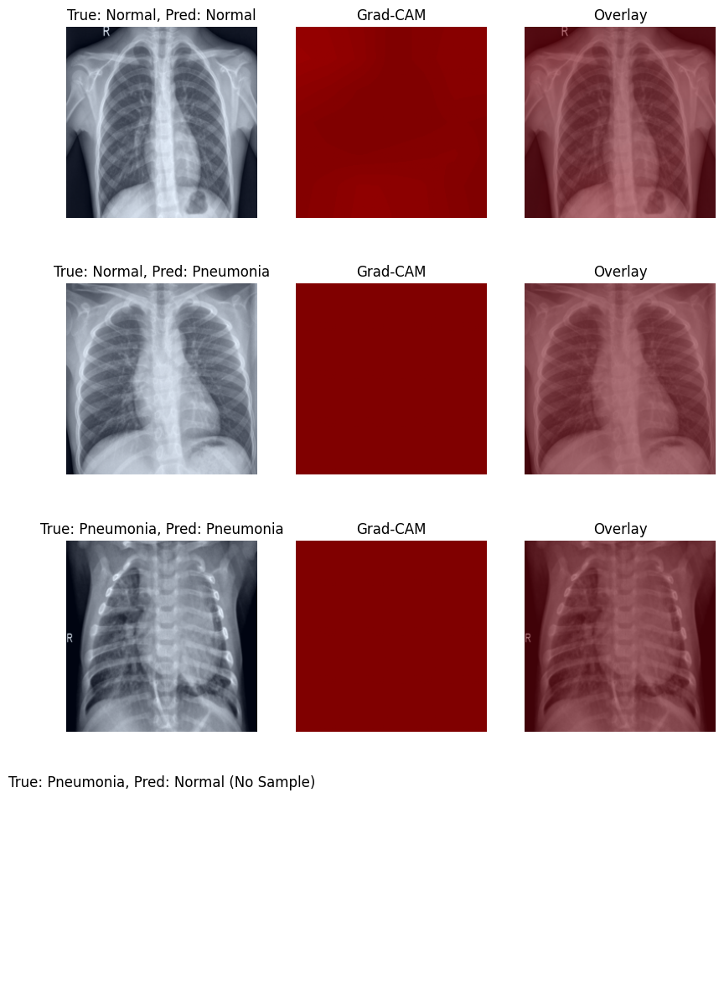

In [ ]:
# 모든 파라미터 활성화
for param in densenet_partial.parameters():
    param.requires_grad = True

# Grad-CAM
main_layer = "features.denseblock4"
sub_layer = "denselayer16.conv2"
visualize_cam(densenet_partial, test_dataloader, main_layer, sub_layer, max_attempts=39)

# 모델 원상복구
densenet_partial = model_type(densenet_partial, mode='partial')

### ResNet

In [ ]:
resnet_partial = model_type(resnet, mode='partial')

In [ ]:
check_trainable_parameters(resnet_partial)

Trainable Parameters:
layer4.0.conv1.weight
layer4.0.bn1.weight
layer4.0.bn1.bias
layer4.0.conv2.weight
layer4.0.bn2.weight
layer4.0.bn2.bias
layer4.0.conv3.weight
layer4.0.bn3.weight
layer4.0.bn3.bias
layer4.0.downsample.0.weight
layer4.0.downsample.1.weight
layer4.0.downsample.1.bias
layer4.1.conv1.weight
layer4.1.bn1.weight
layer4.1.bn1.bias
layer4.1.conv2.weight
layer4.1.bn2.weight
layer4.1.bn2.bias
layer4.1.conv3.weight
layer4.1.bn3.weight
layer4.1.bn3.bias
layer4.2.conv1.weight
layer4.2.bn1.weight
layer4.2.bn1.bias
layer4.2.conv2.weight
layer4.2.bn2.weight
layer4.2.bn2.bias
layer4.2.conv3.weight
layer4.2.bn3.weight
layer4.2.bn3.bias
fc.weight
fc.bias


In [ ]:
trainable_params = [p for p in resnet_partial.parameters() if p.requires_grad]
optimizer = torch.optim.AdamW(trainable_params, lr=1e-3, weight_decay=1e-4)
criterion = nn.CrossEntropyLoss()
scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=10, eta_min=1e-6)

num_epochs = 15
patience = 6

In [ ]:
resnet_partial, resnet_partial_train_loss, resnet_partial_train_acc, resnet_partial_val_loss, resnet_partial_val_acc = train_model(
    model=resnet,
    trainloader=train_dataloader,
    valloader=val_dataloader,
    optimizer=optimizer,
    scheduler=scheduler,
    criterion=criterion,
    num_epochs=num_epochs,
    patience=patience,
    model_name="resnet",
    train_type="partial"
)

Epoch 1/15, Train Loss: 0.0798, Train Acc: 0.9701, Val Loss: 0.0279, Val Acc: 0.9866
Learning Rate Changed: 0.001000 -> 0.000976
New Best Val Loss: 0.0279 (Previous: inf)


Epoch 2/15, Train Loss: 0.0385, Train Acc: 0.9871, Val Loss: 0.0404, Val Acc: 0.9866
Learning Rate Changed: 0.000976 -> 0.000905
Early Stop Counter: 1/7


Epoch 3/15, Train Loss: 0.0409, Train Acc: 0.9849, Val Loss: 0.0542, Val Acc: 0.9809
Learning Rate Changed: 0.000905 -> 0.000794
Early Stop Counter: 2/7


Epoch 4/15, Train Loss: 0.0298, Train Acc: 0.9890, Val Loss: 0.0185, Val Acc: 0.9924
Learning Rate Changed: 0.000794 -> 0.000655
New Best Val Loss: 0.0185 (Previous: 0.0279)


Epoch 5/15, Train Loss: 0.0168, Train Acc: 0.9933, Val Loss: 0.0100, Val Acc: 0.9971
Learning Rate Changed: 0.000655 -> 0.000501
New Best Val Loss: 0.0100 (Previous: 0.0185)


Epoch 6/15, Train Loss: 0.0106, Train Acc: 0.9967, Val Loss: 0.0148, Val Acc: 0.9943
Learning Rate Changed: 0.000501 -> 0.000346
Early Stop Counter: 1/7


Epoch 7/15, Train Loss: 0.0082, Train Acc: 0.9964, Val Loss: 0.0097, Val Acc: 0.9952
Learning Rate Changed: 0.000346 -> 0.000207
New Best Val Loss: 0.0097 (Previous: 0.0100)


Epoch 8/15, Train Loss: 0.0088, Train Acc: 0.9981, Val Loss: 0.0110, Val Acc: 0.9962
Learning Rate Changed: 0.000207 -> 0.000096
Early Stop Counter: 1/7


Epoch 9/15, Train Loss: 0.0056, Train Acc: 0.9981, Val Loss: 0.0086, Val Acc: 0.9962
Learning Rate Changed: 0.000096 -> 0.000025
New Best Val Loss: 0.0086 (Previous: 0.0097)


Epoch 10/15, Train Loss: 0.0041, Train Acc: 0.9986, Val Loss: 0.0110, Val Acc: 0.9962
Learning Rate Changed: 0.000025 -> 0.000001
Early Stop Counter: 1/7


Epoch 11/15, Train Loss: 0.0034, Train Acc: 0.9995, Val Loss: 0.0115, Val Acc: 0.9962
Learning Rate Changed: 0.000001 -> 0.000025
Early Stop Counter: 2/7


Epoch 12/15, Train Loss: 0.0038, Train Acc: 0.9988, Val Loss: 0.0101, Val Acc: 0.9962
Learning Rate Changed: 0.000025 -> 0.000096
Early Stop Counter: 3/7


Epoch 13/15, Train Loss: 0.0018, Train Acc: 0.9998, Val Loss: 0.0135, Val Acc: 0.9943
Learning Rate Changed: 0.000096 -> 0.000207
Early Stop Counter: 4/7


Epoch 14/15, Train Loss: 0.0033, Train Acc: 0.9993, Val Loss: 0.0329, Val Acc: 0.9895
Learning Rate Changed: 0.000207 -> 0.000346
Early Stop Counter: 5/7


Epoch 15/15, Train Loss: 0.0172, Train Acc: 0.9945, Val Loss: 0.0189, Val Acc: 0.9914
Learning Rate Changed: 0.000346 -> 0.000501
Early Stop Counter: 6/7

Loading Best Model from /content/drive/My Drive/model_storage/resnet_partial.pth with val_loss: 0.0086


In [ ]:
model_name = "resnet"
train_type = "partial"
resnet_partial = load_trained_model(resnet, model_name, train_type, device)
resnet_partial = model_type(resnet_partial, mode='partial')

✅ resnet_partial 모델이 로드되었습니다!


In [ ]:
(
    resnet_partial_all_labels,
    resnet_partial_all_predicted,
    resnet_partial_test_loss,
    resnet_partial_accuracy,
    resnet_partial_precision,
    resnet_partial_recall,
    resnet_partial_f1
) = test_model(resnet_partial, test_dataloader, criterion)

Test Loss:        0.8268
Test Accuracy:    0.7804
Test Precision:   0.7437
Test Recall:      0.9897
Test F1 Score:    0.8493


✅ Hook registered at: 2.conv3
샘플 확보 완료 (시도 횟수: 20/39)


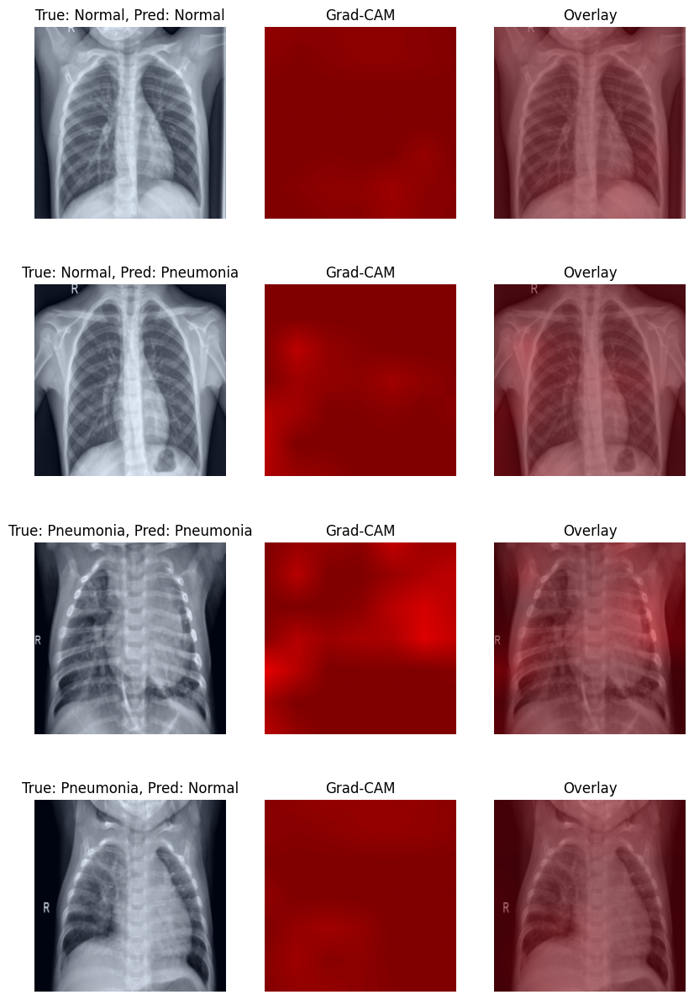

In [ ]:
# 모든 파라미터 활성화
for param in resnet_partial.parameters():
    param.requires_grad = True

# Grad-CAM
main_layer = "layer4"
sub_layer = "2.conv3"
visualize_cam(resnet_partial, test_dataloader, main_layer, sub_layer, max_attempts=39)

# 모델 원상복구
resnet_partial = model_type(resnet_partial, mode='partial')

### GoogLeNet

In [ ]:
googlenet_partial = model_type(googlenet, mode='partial')

In [ ]:
check_trainable_parameters(googlenet_partial)

Trainable Parameters:
inception5a.branch1.conv.weight
inception5a.branch1.bn.weight
inception5a.branch1.bn.bias
inception5a.branch2.0.conv.weight
inception5a.branch2.0.bn.weight
inception5a.branch2.0.bn.bias
inception5a.branch2.1.conv.weight
inception5a.branch2.1.bn.weight
inception5a.branch2.1.bn.bias
inception5a.branch3.0.conv.weight
inception5a.branch3.0.bn.weight
inception5a.branch3.0.bn.bias
inception5a.branch3.1.conv.weight
inception5a.branch3.1.bn.weight
inception5a.branch3.1.bn.bias
inception5a.branch4.1.conv.weight
inception5a.branch4.1.bn.weight
inception5a.branch4.1.bn.bias
inception5b.branch1.conv.weight
inception5b.branch1.bn.weight
inception5b.branch1.bn.bias
inception5b.branch2.0.conv.weight
inception5b.branch2.0.bn.weight
inception5b.branch2.0.bn.bias
inception5b.branch2.1.conv.weight
inception5b.branch2.1.bn.weight
inception5b.branch2.1.bn.bias
inception5b.branch3.0.conv.weight
inception5b.branch3.0.bn.weight
inception5b.branch3.0.bn.bias
inception5b.branch3.1.conv.wei

In [ ]:
trainable_params = [p for p in googlenet_partial.parameters() if p.requires_grad]
optimizer = torch.optim.AdamW(trainable_params, lr=1e-3, weight_decay=1e-4)
criterion = nn.CrossEntropyLoss()
scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=10, eta_min=1e-6)

num_epochs = 20
patience = 7

In [ ]:
googlenet_partial, googlenet_partial_train_loss, googlenet_partial_train_acc, googlenet_partial_val_loss, googlenet_partial_val_acc = train_model(
    model=googlenet,
    trainloader=train_dataloader,
    valloader=val_dataloader,
    optimizer=optimizer,
    scheduler=scheduler,
    criterion=criterion,
    num_epochs=num_epochs,
    patience=patience,
    model_name="googlenet",
    train_type="partial"
)

Epoch 1/20, Train Loss: 0.4971, Train Acc: 0.9486, Val Loss: 0.0575, Val Acc: 0.9780
Learning Rate Changed: 0.001000 -> 0.000976
New Best Val Loss: 0.0575 (Previous: inf)


Epoch 2/20, Train Loss: 0.2266, Train Acc: 0.9677, Val Loss: 0.0500, Val Acc: 0.9847
Learning Rate Changed: 0.000976 -> 0.000905
New Best Val Loss: 0.0500 (Previous: 0.0575)


Epoch 3/20, Train Loss: 0.1975, Train Acc: 0.9708, Val Loss: 0.0524, Val Acc: 0.9838
Learning Rate Changed: 0.000905 -> 0.000794
Early Stop Counter: 1/7


Epoch 4/20, Train Loss: 0.1667, Train Acc: 0.9790, Val Loss: 0.0508, Val Acc: 0.9847
Learning Rate Changed: 0.000794 -> 0.000655
Early Stop Counter: 2/7


Epoch 5/20, Train Loss: 0.1514, Train Acc: 0.9838, Val Loss: 0.0520, Val Acc: 0.9847
Learning Rate Changed: 0.000655 -> 0.000501
Early Stop Counter: 3/7


Epoch 6/20, Train Loss: 0.1466, Train Acc: 0.9861, Val Loss: 0.0552, Val Acc: 0.9847
Learning Rate Changed: 0.000501 -> 0.000346
Early Stop Counter: 4/7


Epoch 7/20, Train Loss: 0.1424, Train Acc: 0.9864, Val Loss: 0.0414, Val Acc: 0.9895
Learning Rate Changed: 0.000346 -> 0.000207
New Best Val Loss: 0.0414 (Previous: 0.0500)


Epoch 8/20, Train Loss: 0.1250, Train Acc: 0.9935, Val Loss: 0.0578, Val Acc: 0.9780
Learning Rate Changed: 0.000207 -> 0.000096
Early Stop Counter: 1/7


Epoch 9/20, Train Loss: 0.1171, Train Acc: 0.9962, Val Loss: 0.0427, Val Acc: 0.9876
Learning Rate Changed: 0.000096 -> 0.000025
Early Stop Counter: 2/7


Epoch 10/20, Train Loss: 0.1210, Train Acc: 0.9959, Val Loss: 0.0433, Val Acc: 0.9857
Learning Rate Changed: 0.000025 -> 0.000001
Early Stop Counter: 3/7


Epoch 11/20, Train Loss: 0.1121, Train Acc: 0.9952, Val Loss: 0.0408, Val Acc: 0.9885
Learning Rate Changed: 0.000001 -> 0.000025
New Best Val Loss: 0.0408 (Previous: 0.0414)


Epoch 12/20, Train Loss: 0.1102, Train Acc: 0.9957, Val Loss: 0.0429, Val Acc: 0.9885
Learning Rate Changed: 0.000025 -> 0.000096
Early Stop Counter: 1/7


Epoch 13/20, Train Loss: 0.1209, Train Acc: 0.9950, Val Loss: 0.0428, Val Acc: 0.9857
Learning Rate Changed: 0.000096 -> 0.000207
Early Stop Counter: 2/7


Epoch 14/20, Train Loss: 0.1152, Train Acc: 0.9957, Val Loss: 0.0388, Val Acc: 0.9885
Learning Rate Changed: 0.000207 -> 0.000346
New Best Val Loss: 0.0388 (Previous: 0.0408)


Epoch 15/20, Train Loss: 0.1304, Train Acc: 0.9924, Val Loss: 0.0494, Val Acc: 0.9857
Learning Rate Changed: 0.000346 -> 0.000501
Early Stop Counter: 1/7


KeyboardInterrupt: 

In [ ]:
model_name = "googlenet"
train_type = "partial"
googlenet_partial = load_trained_model(googlenet, model_name, train_type, device)
googlenet_partial = model_type(googlenet_partial, mode='partial')

✅ googlenet_partial 모델이 로드되었습니다!


In [ ]:
(
    googlenet_partial_all_labels,
    googlenet_partial_all_predicted,
    googlenet_partial_test_loss,
    googlenet_partial_accuracy,
    googlenet_partial_precision,
    googlenet_partial_recall,
    googlenet_partial_f1
) = test_model(googlenet_partial, test_dataloader, criterion)

Test Loss:        0.8634
Test Accuracy:    0.8061
Test Precision:   0.7632
Test Recall:      1.0000
Test F1 Score:    0.8657


✅ Hook registered at: branch2.1.conv
샘플 확보 완료 (시도 횟수: 39/39)


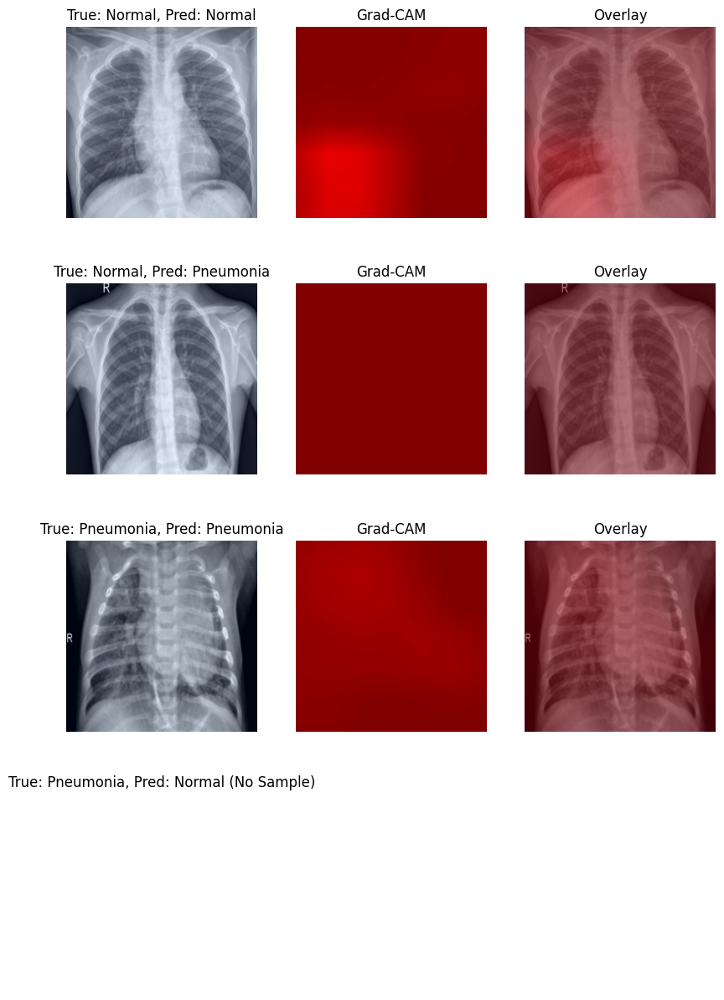

In [ ]:
# 모든 파라미터 활성화
for param in googlenet_partial.parameters():
    param.requires_grad = True

# Grad-CAM
main_layer = "inception5b"
sub_layer = "branch2.1.conv"
visualize_cam(googlenet_partial, test_dataloader, main_layer, sub_layer, max_attempts=39)

# 모델 원상복구
googlenet_partial = model_type(googlenet_partial, mode='partial')

### 시각화

In [ ]:
def pad_to_length(lst, target_length):
    return np.pad(lst, (0, target_length - len(lst)), mode='constant', constant_values=np.nan)

# 최대 에포크 수 설정
max_epochs = num_epochs

# 각 모델의 Loss 데이터를 NaN으로 패딩
densenet_partial_train_loss_padded = pad_to_length(densenet_partial_train_loss, max_epochs)
densenet_partial_val_loss_padded = pad_to_length(densenet_partial_val_loss, max_epochs)
resnet_partial_train_loss_padded = pad_to_length(resnet_partial_train_loss, max_epochs)
resnet_partial_val_loss_padded = pad_to_length(resnet_partial_val_loss, max_epochs)
googlenet_partial_train_loss_padded = pad_to_length(googlenet_partial_train_loss, max_epochs)
googlenet_partial_val_loss_padded = pad_to_length(googlenet_partial_val_loss, max_epochs)

# 각 모델의 Accuracy 데이터를 NaN으로 패딩
densenet_partial_train_acc_padded = pad_to_length(densenet_partial_train_acc, max_epochs)
densenet_partial_val_acc_padded = pad_to_length(densenet_partial_val_acc, max_epochs)
resnet_partial_train_acc_padded = pad_to_length(resnet_partial_train_acc, max_epochs)
resnet_partial_val_acc_padded = pad_to_length(resnet_partial_val_acc, max_epochs)
googlenet_partial_train_acc_padded = pad_to_length(googlenet_partial_train_acc, max_epochs)
googlenet_partial_val_acc_padded = pad_to_length(googlenet_partial_val_acc, max_epochs)

# 시각화
plt.figure(figsize=(12, 5))

# Loss 그래프
plt.subplot(1, 2, 1)
plt.plot(range(1, max_epochs + 1), densenet_partial_train_loss_padded, 'o-', c='r', label='DenseNet Partial Train Loss')
plt.plot(range(1, max_epochs + 1), densenet_partial_val_loss_padded, 'o--', c='r', label='DenseNet Partial Val Loss')
plt.plot(range(1, max_epochs + 1), resnet_partial_train_loss_padded, 's-', c='g', label='ResNet Partial Train Loss')
plt.plot(range(1, max_epochs + 1), resnet_partial_val_loss_padded, 's--', c='g', label='ResNet Partial Val Loss')
plt.plot(range(1, max_epochs + 1), googlenet_partial_train_loss_padded, 'd-', c='b', label='GoogLeNet Partial Train Loss')
plt.plot(range(1, max_epochs + 1), googlenet_partial_val_loss_padded, 'd--', c='b', label='GoogLeNet Partial Val Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Loss Comparison')
plt.legend()
plt.grid(True)

# Accuracy 그래프
plt.subplot(1, 2, 2)
plt.plot(range(1, max_epochs + 1), densenet_partial_train_acc_padded, 'o-', c='r', label='DenseNet Partial Train Accuracy')
plt.plot(range(1, max_epochs + 1), densenet_partial_val_acc_padded, 'o--', c='r', label='DenseNet Partial Val Accuracy')
plt.plot(range(1, max_epochs + 1), resnet_partial_train_acc_padded, 's-', c='g', label='ResNet Partial Train Accuracy')
plt.plot(range(1, max_epochs + 1), resnet_partial_val_acc_padded, 's--', c='g', label='ResNet Partial Val Accuracy')
plt.plot(range(1, max_epochs + 1), googlenet_partial_train_acc_padded, 'd-', c='b', label='GoogLeNet Partial Train Accuracy')
plt.plot(range(1, max_epochs + 1), googlenet_partial_val_acc_padded, 'd--', c='b', label='GoogLeNet Partial Val Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Accuracy Comparison')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()

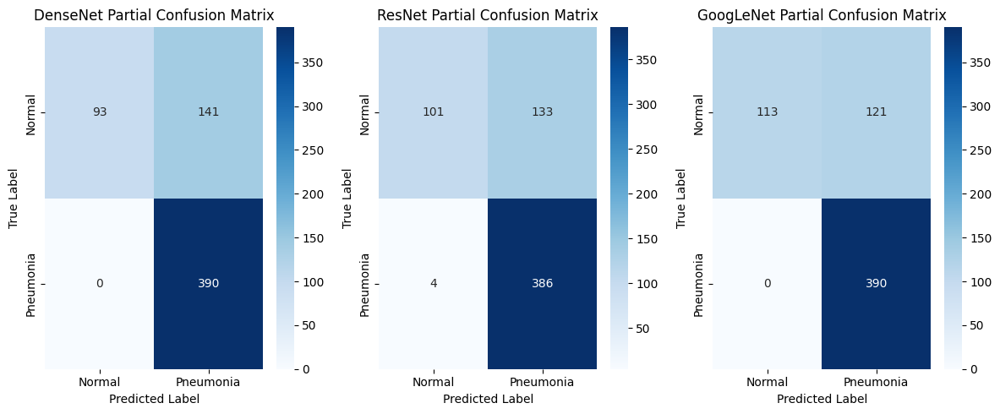

In [ ]:
plt.figure(figsize=(12, 5))

# DenseNet
plt.subplot(1, 3, 1)
densenet_partial_confusion_matrix = confusion_matrix(densenet_partial_all_labels, densenet_partial_all_predicted)
sns.heatmap(densenet_partial_confusion_matrix, annot=True, fmt="d", cmap="Blues", xticklabels=["Normal", "Pneumonia"], yticklabels=["Normal", "Pneumonia"])
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("DenseNet Partial Confusion Matrix")

# ResNet
plt.subplot(1, 3, 2)
resnet_partial_confusion_matrix = confusion_matrix(resnet_partial_all_labels, resnet_partial_all_predicted)
sns.heatmap(resnet_partial_confusion_matrix, annot=True, fmt="d", cmap="Blues", xticklabels=["Normal", "Pneumonia"], yticklabels=["Normal", "Pneumonia"])
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("ResNet Partial Confusion Matrix")

# GoogLeNet
plt.subplot(1, 3, 3)
googlenet_partial_confusion_matrix = confusion_matrix(googlenet_partial_all_labels, googlenet_partial_all_predicted)
sns.heatmap(googlenet_partial_confusion_matrix, annot=True, fmt="d", cmap="Blues", xticklabels=["Normal", "Pneumonia"], yticklabels=["Normal", "Pneumonia"])
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("GoogLeNet Partial Confusion Matrix")

plt.tight_layout()
plt.show()

## Full

### DenseNet

In [ ]:
densenet_full = model_type(densenet, mode='full')

In [ ]:
optimizer = torch.optim.AdamW(densenet_full.parameters(), lr=1e-3, weight_decay=1e-4)
criterion = nn.CrossEntropyLoss()
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, patience=5, factor=0.5, min_lr=1e-6)

num_epochs = 30
patience = 10

In [ ]:
densenet_full, densenet_full_train_loss, densenet_full_train_acc, densenet_full_val_loss, densenet_full_val_acc = train_model(
    model=densenet,
    trainloader=train_dataloader,
    valloader=val_dataloader,
    optimizer=optimizer,
    scheduler=scheduler,
    criterion=criterion,
    num_epochs=num_epochs,
    patience=patience,
    model_name="densenet",
    train_type="full"
)

Epoch 1/14, Train Loss: 0.0721, Train Acc: 0.9730, Val Loss: 0.0698, Val Acc: 0.9761
New Best Val Loss: 0.0698 (Previous: inf)


Epoch 2/14, Train Loss: 0.0683, Train Acc: 0.9740, Val Loss: 0.0596, Val Acc: 0.9866
New Best Val Loss: 0.0596 (Previous: 0.0698)


Epoch 3/14, Train Loss: 0.0555, Train Acc: 0.9795, Val Loss: 0.0793, Val Acc: 0.9761
Early Stop Counter: 1/5


Epoch 4/14, Train Loss: 0.0435, Train Acc: 0.9847, Val Loss: 0.0553, Val Acc: 0.9790
New Best Val Loss: 0.0553 (Previous: 0.0596)


Epoch 5/14, Train Loss: 0.0538, Train Acc: 0.9797, Val Loss: 0.0629, Val Acc: 0.9780
Early Stop Counter: 1/5


Epoch 6/14, Train Loss: 0.0423, Train Acc: 0.9849, Val Loss: 0.0330, Val Acc: 0.9885
New Best Val Loss: 0.0330 (Previous: 0.0553)


Epoch 7/14, Train Loss: 0.0417, Train Acc: 0.9869, Val Loss: 0.0399, Val Acc: 0.9847
Early Stop Counter: 1/5


Epoch 8/14, Train Loss: 0.0392, Train Acc: 0.9838, Val Loss: 0.0406, Val Acc: 0.9828
Early Stop Counter: 2/5


Epoch 9/14, Train Loss: 0.0340, Train Acc: 0.9881, Val Loss: 0.0526, Val Acc: 0.9809
Early Stop Counter: 3/5


Epoch 10/14, Train Loss: 0.0380, Train Acc: 0.9864, Val Loss: 0.0316, Val Acc: 0.9857
New Best Val Loss: 0.0316 (Previous: 0.0330)


Epoch 11/14, Train Loss: 0.0331, Train Acc: 0.9878, Val Loss: 0.0515, Val Acc: 0.9838
Early Stop Counter: 1/5


KeyboardInterrupt: 

In [ ]:
model_name = "densenet"
train_type = "full"
densenet_full = load_trained_model(densenet, model_name, train_type, device)
densenet_full = model_type(densenet_full, mode='full')

✅ densenet_full 모델이 로드되었습니다!


In [ ]:
(
    densenet_full_all_labels,
    densenet_full_all_predicted,
    densenet_full_test_loss,
    densenet_full_accuracy,
    densenet_full_precision,
    densenet_full_recall,
    densenet_full_f1
) = test_model(densenet_full, test_dataloader, criterion)

Test Loss:        1.2002
Test Accuracy:    0.8125
Test Precision:   0.7692
Test Recall:      1.0000
Test F1 Score:    0.8696


✅ Hook registered at: denselayer16.conv2
샘플 확보 완료 (시도 횟수: 39/39)


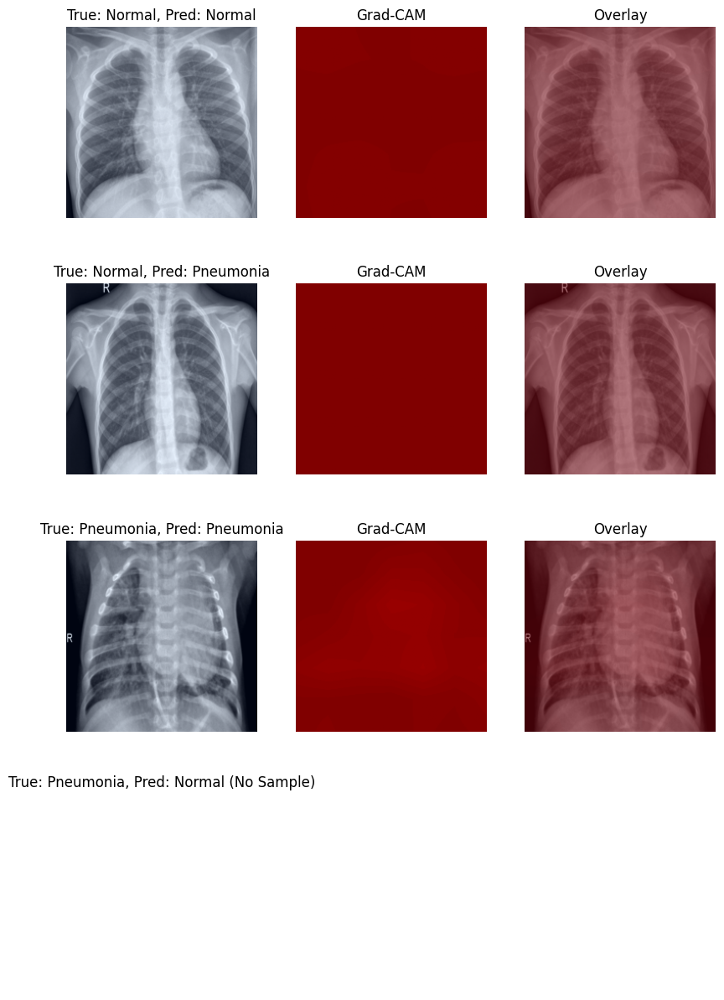

In [ ]:
# 모든 파라미터 활성화
for param in densenet_full.parameters():
    param.requires_grad = True

# Grad-CAM
main_layer = "features.denseblock4"
sub_layer = "denselayer16.conv2"
visualize_cam(densenet_full, test_dataloader, main_layer, sub_layer, max_attempts=39)

# 모델 원상복구
densenet_full = model_type(densenet_full, mode='full')

### ResNet

In [ ]:
resnet_full = model_type(resnet, mode='full')

In [ ]:
optimizer = torch.optim.AdamW(resnet_full.parameters(), lr=1e-3, weight_decay=1e-4)
criterion = nn.CrossEntropyLoss()
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, patience=3, factor=0.5, min_lr=1e-6)

num_epochs = 13
patience = 7

In [ ]:
resnet_full, resnet_full_train_loss, resnet_full_train_acc, resnet_full_val_loss, resnet_full_val_acc = train_model(
    model=resnet,
    trainloader=train_dataloader,
    valloader=val_dataloader,
    optimizer=optimizer,
    scheduler=scheduler,
    criterion=criterion,
    num_epochs=num_epochs,
    patience=patience,
    model_name="resnet",
    train_type="full"
)

# 7

Epoch 1/13, Train Loss: 0.1112, Train Acc: 0.9582, Val Loss: 0.0569, Val Acc: 0.9713
New Best Val Loss: 0.0569 (Previous: inf)


Epoch 2/13, Train Loss: 0.1033, Train Acc: 0.9582, Val Loss: 0.0605, Val Acc: 0.9771
Early Stop Counter: 1/7


Epoch 3/13, Train Loss: 0.1010, Train Acc: 0.9642, Val Loss: 0.0527, Val Acc: 0.9780
New Best Val Loss: 0.0527 (Previous: 0.0569)


Epoch 4/13, Train Loss: 0.0912, Train Acc: 0.9651, Val Loss: 0.2163, Val Acc: 0.9207
Early Stop Counter: 1/7


Epoch 5/13, Train Loss: 0.0862, Train Acc: 0.9668, Val Loss: 0.0817, Val Acc: 0.9771
Early Stop Counter: 2/7


Epoch 6/13, Train Loss: 0.0831, Train Acc: 0.9680, Val Loss: 0.1219, Val Acc: 0.9465
Early Stop Counter: 3/7


Epoch 7/13, Train Loss: 0.0759, Train Acc: 0.9708, Val Loss: 0.0496, Val Acc: 0.9799
New Best Val Loss: 0.0496 (Previous: 0.0527)


Epoch 8/13, Train Loss: 0.0766, Train Acc: 0.9699, Val Loss: 0.0569, Val Acc: 0.9790
Early Stop Counter: 1/7


KeyboardInterrupt: 

In [ ]:
model_name = "resnet"
train_type = "full"
resnet_full = load_trained_model(resnet, model_name, train_type, device)
resnet_full = model_type(resnet_full, mode='full')

✅ resnet_full 모델이 로드되었습니다!


In [ ]:
(
    resnet_full_all_labels,
    resnet_full_all_predicted,
    resnet_full_test_loss,
    resnet_full_accuracy,
    resnet_full_precision,
    resnet_full_recall,
    resnet_full_f1
) = test_model(resnet_full, test_dataloader, criterion)

Test Loss:        0.8268
Test Accuracy:    0.7804
Test Precision:   0.7437
Test Recall:      0.9897
Test F1 Score:    0.8493


✅ Hook registered at: 2.conv3
샘플 확보 완료 (시도 횟수: 20/39)


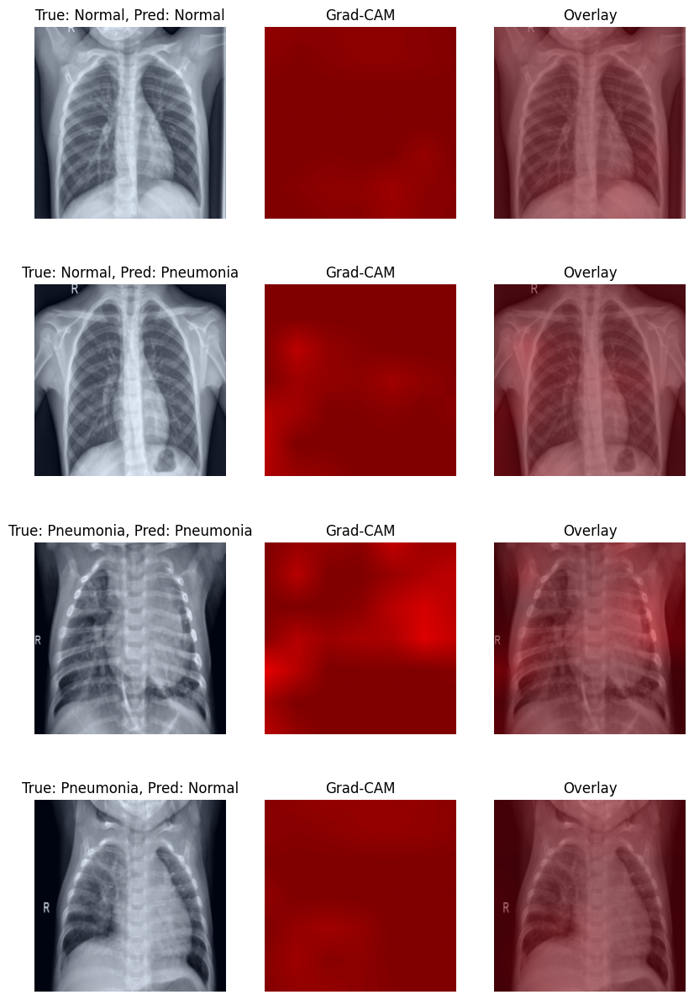

In [ ]:
# 모든 파라미터 활성화
for param in resnet_full.parameters():
    param.requires_grad = True

# Grad-CAM
main_layer = "layer4"
sub_layer = "2.conv3"
visualize_cam(resnet_full, test_dataloader, main_layer, sub_layer, max_attempts=39)

# 모델 원상복구
resnet_full = model_type(resnet_full, mode='full')

### GoogLeNet

In [ ]:
goolgenet_full = model_type(googlenet, mode='full')

In [ ]:
optimizer = torch.optim.AdamW(goolgenet_full.parameters(), lr=1e-3, weight_decay=1e-4)
criterion = nn.CrossEntropyLoss()
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, patience=3, factor=0.5, min_lr=1e-6)

num_epochs = 20
patience = 7

In [ ]:
googlenet_full, googlenet_full_train_loss, googlenet_full_train_acc, googlenet_full_val_loss, googlenet_full_val_acc = train_model(
    model=googlenet,
    trainloader=train_dataloader,
    valloader=val_dataloader,
    optimizer=optimizer,
    scheduler=scheduler,
    criterion=criterion,
    num_epochs=num_epochs,
    patience=patience,
    model_name="googlenet",
    train_type="full"
)

Epoch 1/20, Train Loss: 0.3180, Train Acc: 0.9481, Val Loss: 0.0527, Val Acc: 0.9819
New Best Val Loss: 0.0527 (Previous: inf)


Epoch 2/20, Train Loss: 0.1969, Train Acc: 0.9589, Val Loss: 0.0651, Val Acc: 0.9733
Early Stop Counter: 1/7


Epoch 3/20, Train Loss: 0.1271, Train Acc: 0.9740, Val Loss: 0.0791, Val Acc: 0.9685
Early Stop Counter: 2/7


Epoch 4/20, Train Loss: 0.1354, Train Acc: 0.9694, Val Loss: 0.0624, Val Acc: 0.9771
Early Stop Counter: 3/7


Epoch 5/20, Train Loss: 0.1241, Train Acc: 0.9744, Val Loss: 0.0548, Val Acc: 0.9828
Learning Rate Changed: 0.001000 -> 0.000500
Early Stop Counter: 4/7


Epoch 6/20, Train Loss: 0.0769, Train Acc: 0.9842, Val Loss: 0.0370, Val Acc: 0.9866
New Best Val Loss: 0.0370 (Previous: 0.0527)


Epoch 7/20, Train Loss: 0.0524, Train Acc: 0.9902, Val Loss: 0.0474, Val Acc: 0.9876
Early Stop Counter: 1/7


Epoch 8/20, Train Loss: 0.0602, Train Acc: 0.9864, Val Loss: 0.0389, Val Acc: 0.9866
Early Stop Counter: 2/7


KeyboardInterrupt: 

In [ ]:
model_name = "googlenet"
train_type = "full"
googlenet_full = load_trained_model(googlenet, model_name, train_type, device)
goolgenet_full = model_type(goolgenet_full, mode='full')

✅ googlenet_full 모델이 로드되었습니다!


In [ ]:
(
    goolgenet_full_all_labels,
    goolgenet_full_all_predicted,
    goolgenet_full_test_loss,
    goolgenet_full_accuracy,
    goolgenet_full_precision,
    goolgenet_full_recall,
    goolgenet_full_f1
) = test_model(goolgenet_full, test_dataloader, criterion)

Test Loss:        0.8634
Test Accuracy:    0.8061
Test Precision:   0.7632
Test Recall:      1.0000
Test F1 Score:    0.8657


✅ Hook registered at: branch2.1.conv
샘플 확보 완료 (시도 횟수: 39/39)


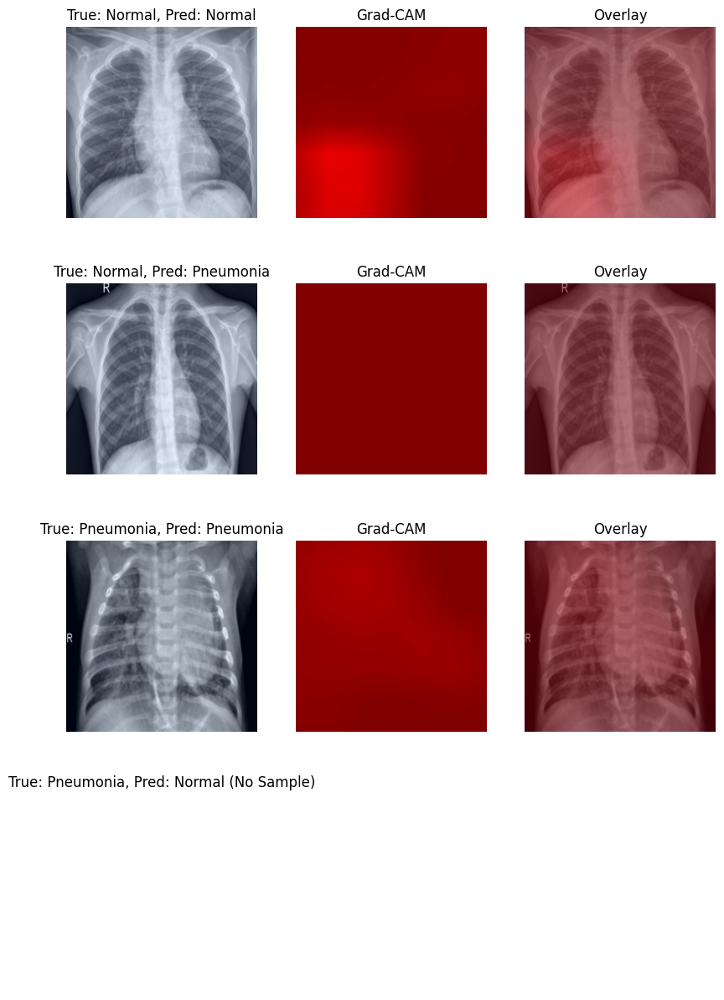

In [ ]:
# 모든 파라미터 활성화
for param in goolgenet_full.parameters():
    param.requires_grad = True

# Grad-CAM
main_layer = "inception5b"
sub_layer = "branch2.1.conv"
visualize_cam(goolgenet_full, test_dataloader, main_layer, sub_layer, max_attempts=39)

# 모델 원상복구
goolgenet_full = model_type(goolgenet_full, mode='full')

### 시각화

In [ ]:
def pad_to_length(lst, target_length):
    return np.pad(lst, (0, target_length - len(lst)), mode='constant', constant_values=np.nan)

# 최대 에포크 수 설정
max_epochs = num_epochs

# 각 모델의 Loss 데이터를 NaN으로 패딩
densenet_full_train_loss_padded = pad_to_length(densenet_full_train_loss, max_epochs)
densenet_full_val_loss_padded = pad_to_length(densenet_full_val_loss, max_epochs)
resnet_full_train_loss_padded = pad_to_length(resnet_full_train_loss, max_epochs)
resnet_full_val_loss_padded = pad_to_length(resnet_full_val_loss, max_epochs)
googlenet_full_train_loss_padded = pad_to_length(googlenet_full_train_loss, max_epochs)
googlenet_full_val_loss_padded = pad_to_length(googlenet_full_val_loss, max_epochs)

# 각 모델의 Accuracy 데이터를 NaN으로 패딩
densenet_full_train_acc_padded = pad_to_length(densenet_full_train_acc, max_epochs)
densenet_full_val_acc_padded = pad_to_length(densenet_full_val_acc, max_epochs)
resnet_full_train_acc_padded = pad_to_length(resnet_full_train_acc, max_epochs)
resnet_full_val_acc_padded = pad_to_length(resnet_full_val_acc, max_epochs)
googlenet_full_train_acc_padded = pad_to_length(googlenet_full_train_acc, max_epochs)
googlenet_full_val_acc_padded = pad_to_length(googlenet_full_val_acc, max_epochs)

# 시각화
plt.figure(figsize=(12, 5))

# Loss 그래프
plt.subplot(1, 2, 1)
plt.plot(range(1, max_epochs + 1), densenet_full_train_loss_padded, 'o-', c='r', label='DenseNet Full Train Loss')
plt.plot(range(1, max_epochs + 1), densenet_full_val_loss_padded, 'o--', c='r', label='DenseNet Full Val Loss')
plt.plot(range(1, max_epochs + 1), resnet_full_train_loss_padded, 's-', c='g', label='ResNet Full Train Loss')
plt.plot(range(1, max_epochs + 1), resnet_full_val_loss_padded, 's--', c='g', label='ResNet Full Val Loss')
plt.plot(range(1, max_epochs + 1), googlenet_full_train_loss_padded, 'd-', c='b', label='GoogLeNet Full Train Loss')
plt.plot(range(1, max_epochs + 1), googlenet_full_val_loss_padded, 'd--', c='b', label='GoogLeNet Full Val Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Loss Comparison')
plt.legend()
plt.grid(True)

# Accuracy 그래프
plt.subplot(1, 2, 2)
plt.plot(range(1, max_epochs + 1), densenet_full_train_acc_padded, 'o-', c='r', label='DenseNet Full Train Accuracy')
plt.plot(range(1, max_epochs + 1), densenet_full_val_acc_padded, 'o--', c='r', label='DenseNet Full Val Accuracy')
plt.plot(range(1, max_epochs + 1), resnet_full_train_acc_padded, 's-', c='g', label='ResNet Full Train Accuracy')
plt.plot(range(1, max_epochs + 1), resnet_full_val_acc_padded, 's--', c='g', label='ResNet Full Val Accuracy')
plt.plot(range(1, max_epochs + 1), googlenet_full_train_acc_padded, 'd-', c='b', label='GoogLeNet Full Train Accuracy')
plt.plot(range(1, max_epochs + 1), googlenet_full_val_acc_padded, 'd--', c='b', label='GoogLeNet Full Val Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Accuracy Comparison')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()

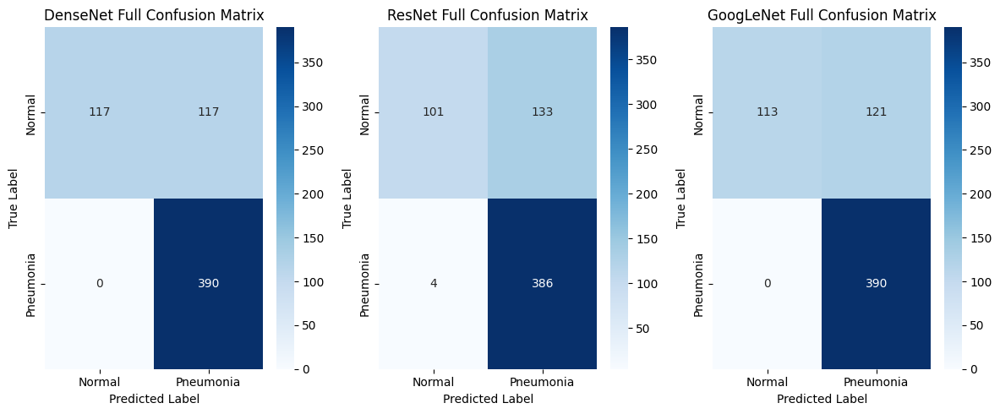

In [ ]:
plt.figure(figsize=(12, 5))

# DenseNet
plt.subplot(1, 3, 1)
densenet_full_confusion_matrix = confusion_matrix(densenet_full_all_labels, densenet_full_all_predicted)
sns.heatmap(densenet_full_confusion_matrix, annot=True, fmt="d", cmap="Blues", xticklabels=["Normal", "Pneumonia"], yticklabels=["Normal", "Pneumonia"])
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("DenseNet Full Confusion Matrix")

# ResNet
plt.subplot(1, 3, 2)
resnet_full_confusion_matrix = confusion_matrix(resnet_full_all_labels, resnet_full_all_predicted)
sns.heatmap(resnet_full_confusion_matrix, annot=True, fmt="d", cmap="Blues", xticklabels=["Normal", "Pneumonia"], yticklabels=["Normal", "Pneumonia"])
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("ResNet Full Confusion Matrix")

# GoogLeNet
plt.subplot(1, 3, 3)
googlenet_full_confusion_matrix = confusion_matrix(goolgenet_full_all_labels, goolgenet_full_all_predicted)
sns.heatmap(googlenet_full_confusion_matrix, annot=True, fmt="d", cmap="Blues", xticklabels=["Normal", "Pneumonia"], yticklabels=["Normal", "Pneumonia"])
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("GoogLeNet Full Confusion Matrix")

plt.tight_layout()
plt.show()